# 5 - Multi-Product Autoencoder for Visual Anomaly Detection

Neste notebook vamos construir uma nova versão do pipeline de detecção de anomalias visuais usando autoencoders.

A ideia é melhorar o projeto anterior, que usava apenas a categoria `bottle` do MVTec AD, testando uma abordagem com mais categorias de objetos estruturados.

## Objetivo

Treinar e avaliar um modelo de reconstrução para detectar anomalias visuais em produtos industriais.

O pipeline será:

1. Baixar ou carregar o dataset MVTec AD.
2. Selecionar categorias de objetos estruturados.
3. Usar apenas imagens normais no treino.
4. Treinar um denoising autoencoder.
5. Calcular erro de reconstrução.
6. Definir threshold usando validação normal.
7. Avaliar imagens normais e anômalas.
8. Gerar heatmaps e máscaras de anomalia.

## Categorias iniciais

Vamos começar com objetos estruturados, pois são mais interessantes para portfólio e dashboard:

- bottle
- capsule
- hazelnut
- metal_nut
- pill
- screw
- zipper

## Hipótese

O projeto antigo talvez tenha sofrido por três motivos principais:

- poucas imagens usando apenas `bottle`;
- threshold instável;
- modelo reconstruindo bem demais ou gerando mapas de erro pouco claros.

Neste notebook vamos testar se usar mais categorias visualmente parecidas e um pipeline mais controlado melhora a detecção.

In [5]:
# =========================
# 1. Imports
# =========================

import os
import random
import tarfile
import zipfile
import urllib.request
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    precision_recall_curve,
    average_precision_score
)

In [6]:
# =========================
# 2. General Configuration
# =========================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

IMG_SIZE = 256
BATCH_SIZE = 16
EPOCHS = 100
LEARNING_RATE = 1e-3

SELECTED_CATEGORIES = [
    "bottle",
    "capsule",
    "hazelnut",
    "metal_nut",
    "pill",
    "screw",
    "zipper"
]

print("Device:", DEVICE)
print("Selected categories:", SELECTED_CATEGORIES)

Device: cuda
Selected categories: ['bottle', 'capsule', 'hazelnut', 'metal_nut', 'pill', 'screw', 'zipper']


In [8]:
# =========================
# 3. Kaggle Setup
# =========================

from google.colab import files
from pathlib import Path

DATA_DIR = Path("/content/data")
DATA_DIR.mkdir(parents=True, exist_ok=True)

# Faça upload do arquivo kaggle.json
uploaded = files.upload()

# Move o kaggle.json para a pasta correta
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle configurado com sucesso.")

Saving kaggle.json to kaggle.json
Kaggle configurado com sucesso.


In [9]:
# =========================
# 4. Download MVTec AD from Kaggle
# =========================

!mkdir -p /content/data
!kaggle datasets download -d ipythonx/mvtec-ad -p /content/data --unzip

Dataset URL: https://www.kaggle.com/datasets/ipythonx/mvtec-ad
License(s): copyright-authors
100% 4.91G/4.91G [00:58<00:00, 89.5MB/s]



In [10]:
# =========================
# 5. Locate MVTec Categories
# =========================

DATA_DIR = Path("/content/data")

category_paths = {}

for category in SELECTED_CATEGORIES:
    candidates = list(DATA_DIR.rglob(category))

    valid_candidates = [
        p for p in candidates
        if (p / "train" / "good").exists() and (p / "test").exists()
    ]

    if len(valid_candidates) > 0:
        category_paths[category] = valid_candidates[0]
    else:
        print(f"Categoria não encontrada ou inválida: {category}")

print("\nCategorias encontradas:")
for category, path in category_paths.items():
    print(f"{category}: {path}")

print("\nTotal:", len(category_paths), "de", len(SELECTED_CATEGORIES))


Categorias encontradas:
bottle: /content/data/bottle
capsule: /content/data/capsule
hazelnut: /content/data/hazelnut
metal_nut: /content/data/metal_nut
pill: /content/data/pill
screw: /content/data/screw
zipper: /content/data/zipper

Total: 7 de 7


In [11]:
# =========================
# 6. Dataset Summary
# =========================

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def list_images(folder):
    folder = Path(folder)

    if not folder.exists():
        return []

    return sorted([
        p for p in folder.rglob("*")
        if p.suffix.lower() in IMAGE_EXTENSIONS
    ])


summary = []

for category, root in category_paths.items():
    train_good_dir = root / "train" / "good"
    test_dir = root / "test"

    train_good_count = len(list_images(train_good_dir))
    test_good_count = len(list_images(test_dir / "good"))

    anomaly_count = 0
    anomaly_classes = []

    for defect_dir in sorted(test_dir.iterdir()):
        if defect_dir.is_dir() and defect_dir.name != "good":
            count = len(list_images(defect_dir))
            anomaly_count += count
            anomaly_classes.append((defect_dir.name, count))

    summary.append({
        "category": category,
        "train_good": train_good_count,
        "test_good": test_good_count,
        "test_anomaly": anomaly_count,
        "anomaly_classes": anomaly_classes
    })


for item in summary:
    print("=" * 60)
    print("Category:", item["category"])
    print("Train good:", item["train_good"])
    print("Test good:", item["test_good"])
    print("Test anomaly:", item["test_anomaly"])
    print("Anomaly classes:")

    for defect_name, count in item["anomaly_classes"]:
        print(f"  - {defect_name}: {count}")

Category: bottle
Train good: 209
Test good: 20
Test anomaly: 63
Anomaly classes:
  - broken_large: 20
  - broken_small: 22
  - contamination: 21
Category: capsule
Train good: 219
Test good: 23
Test anomaly: 109
Anomaly classes:
  - crack: 23
  - faulty_imprint: 22
  - poke: 21
  - scratch: 23
  - squeeze: 20
Category: hazelnut
Train good: 391
Test good: 40
Test anomaly: 70
Anomaly classes:
  - crack: 18
  - cut: 17
  - hole: 18
  - print: 17
Category: metal_nut
Train good: 220
Test good: 22
Test anomaly: 93
Anomaly classes:
  - bent: 25
  - color: 22
  - flip: 23
  - scratch: 23
Category: pill
Train good: 267
Test good: 26
Test anomaly: 141
Anomaly classes:
  - color: 25
  - combined: 17
  - contamination: 21
  - crack: 26
  - faulty_imprint: 19
  - pill_type: 9
  - scratch: 24
Category: screw
Train good: 320
Test good: 41
Test anomaly: 119
Anomaly classes:
  - manipulated_front: 24
  - scratch_head: 24
  - scratch_neck: 25
  - thread_side: 23
  - thread_top: 23
Category: zipper
Train 

In [12]:
# =========================
# 7. Build Train / Validation / Test Lists
# =========================

all_train_good = []
all_test_samples = []

for category, root in category_paths.items():
    train_good_dir = root / "train" / "good"
    test_dir = root / "test"

    # Train good images
    for img_path in list_images(train_good_dir):
        all_train_good.append({
            "path": img_path,
            "category": category,
            "label": 0,  # normal
            "defect_type": "good"
        })

    # Test images: good + anomalies
    for defect_dir in sorted(test_dir.iterdir()):
        if not defect_dir.is_dir():
            continue

        defect_type = defect_dir.name
        label = 0 if defect_type == "good" else 1

        for img_path in list_images(defect_dir):
            all_test_samples.append({
                "path": img_path,
                "category": category,
                "label": label,
                "defect_type": defect_type
            })

print("Total train good:", len(all_train_good))
print("Total test samples:", len(all_test_samples))

normal_test = sum(1 for x in all_test_samples if x["label"] == 0)
anomaly_test = sum(1 for x in all_test_samples if x["label"] == 1)

print("Test normal:", normal_test)
print("Test anomaly:", anomaly_test)

Total train good: 1866
Total test samples: 918
Test normal: 204
Test anomaly: 714


In [13]:
# =========================
# 8. Split Normal Training Data
# =========================

random.shuffle(all_train_good)

VAL_RATIO = 0.15

val_size = int(len(all_train_good) * VAL_RATIO)
train_size = len(all_train_good) - val_size

train_samples = all_train_good[:train_size]
val_samples = all_train_good[train_size:]

print("Train samples:", len(train_samples))
print("Validation normal samples:", len(val_samples))

# Conferir distribuição por categoria
def count_by_category(samples):
    counts = {}
    for sample in samples:
        category = sample["category"]
        counts[category] = counts.get(category, 0) + 1
    return counts

print("\nTrain distribution:")
for category, count in count_by_category(train_samples).items():
    print(f"{category}: {count}")

print("\nValidation distribution:")
for category, count in count_by_category(val_samples).items():
    print(f"{category}: {count}")

Train samples: 1587
Validation normal samples: 279

Train distribution:
hazelnut: 331
pill: 226
capsule: 192
screw: 267
zipper: 198
metal_nut: 197
bottle: 176

Validation distribution:
hazelnut: 60
bottle: 33
pill: 41
screw: 53
zipper: 42
capsule: 27
metal_nut: 23


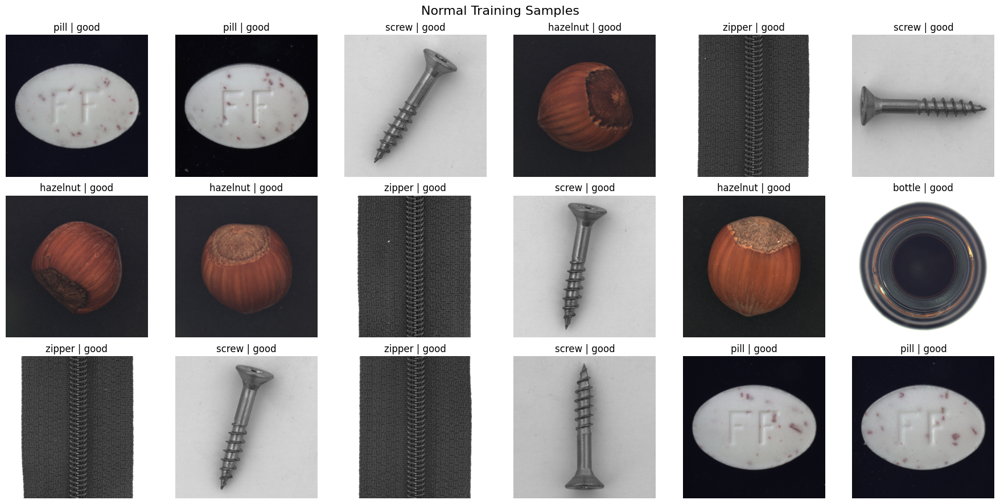

In [14]:
# =========================
# 9. Visualize Normal Training Samples
# =========================

def show_sample_grid(samples, n=12, title="Samples"):
    selected = random.sample(samples, min(n, len(samples)))

    cols = 6
    rows = int(np.ceil(len(selected) / cols))

    plt.figure(figsize=(18, 3 * rows))

    for i, sample in enumerate(selected):
        img = Image.open(sample["path"]).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"{sample['category']} | {sample['defect_type']}")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

show_sample_grid(train_samples, n=18, title="Normal Training Samples")

In [15]:
# =========================
# 10. Transforms and Dataset
# =========================

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])


class MultiProductReconstructionDataset(Dataset):
    def __init__(self, samples, transform=None, return_metadata=False):
        self.samples = samples
        self.transform = transform
        self.return_metadata = return_metadata

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]

        image = Image.open(sample["path"]).convert("RGB")

        if self.transform:
            image = self.transform(image)

        # Autoencoder:
        # input = imagem
        # target = mesma imagem
        if self.return_metadata:
            return image, image, {
                "path": str(sample["path"]),
                "category": sample["category"],
                "label": sample["label"],
                "defect_type": sample["defect_type"]
            }

        return image, image

In [16]:
# =========================
# 11. DataLoaders
# =========================

train_dataset = MultiProductReconstructionDataset(
    train_samples,
    transform=transform,
    return_metadata=False
)

val_dataset = MultiProductReconstructionDataset(
    val_samples,
    transform=transform,
    return_metadata=False
)

test_dataset = MultiProductReconstructionDataset(
    all_test_samples,
    transform=transform,
    return_metadata=True
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("Train batches:", len(train_loader))
print("Val batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train batches: 100
Val batches: 18
Test batches: 58


Images shape: torch.Size([16, 3, 256, 256])
Targets shape: torch.Size([16, 3, 256, 256])
Min pixel value: 0.03529411926865578
Max pixel value: 1.0


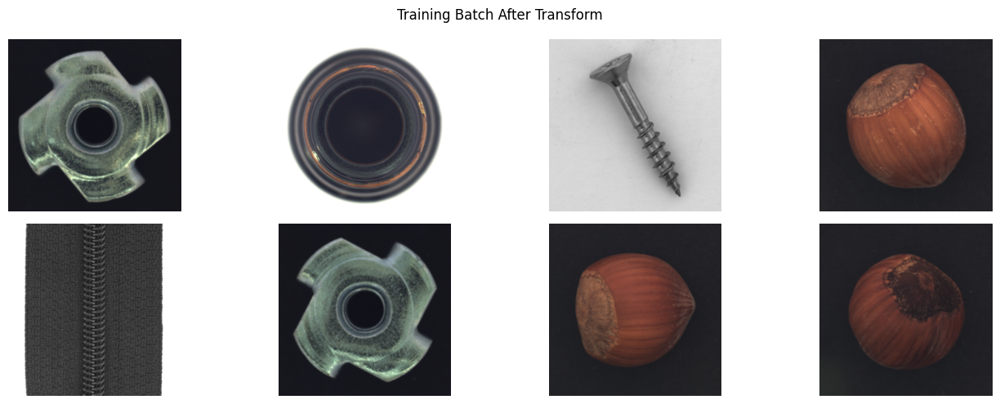

In [17]:
# =========================
# 12. Check One Training Batch
# =========================

images, targets = next(iter(train_loader))

print("Images shape:", images.shape)
print("Targets shape:", targets.shape)
print("Min pixel value:", images.min().item())
print("Max pixel value:", images.max().item())

plt.figure(figsize=(14, 5))

for i in range(min(8, images.shape[0])):
    img = images[i].permute(1, 2, 0).cpu().numpy()

    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.axis("off")

plt.suptitle("Training Batch After Transform")
plt.tight_layout()
plt.show()

In [18]:
# =========================
# 13. Denoising ConvAutoencoder
# =========================

class DenoisingConvAutoencoder(nn.Module):
    def __init__(self, latent_channels=256):
        super().__init__()

        # Encoder: 3 x 256 x 256 -> 256 x 16 x 16
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),    # 32 x 128 x 128
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),   # 64 x 64 x 64
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 128 x 32 x 32
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, latent_channels, kernel_size=4, stride=2, padding=1),  # 256 x 16 x 16
            nn.BatchNorm2d(latent_channels),
            nn.ReLU(inplace=True),
        )

        # Decoder: 256 x 16 x 16 -> 3 x 256 x 256
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_channels, 128, kernel_size=4, stride=2, padding=1),  # 128 x 32 x 32
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 64 x 64 x 64
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),   # 32 x 128 x 128
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),    # 3 x 256 x 256
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded


model = DenoisingConvAutoencoder(latent_channels=256).to(DEVICE)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(model)
print(f"\nTotal parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

DenoisingConvAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=Tr

In [19]:
# =========================
# 14. Forward Pass Test
# =========================

model.eval()

with torch.no_grad():
    sample_batch = images.to(DEVICE)
    reconstructed = model(sample_batch)

print("Input shape:", sample_batch.shape)
print("Output shape:", reconstructed.shape)
print("Output min:", reconstructed.min().item())
print("Output max:", reconstructed.max().item())

Input shape: torch.Size([16, 3, 256, 256])
Output shape: torch.Size([16, 3, 256, 256])
Output min: 0.4817560017108917
Output max: 0.5184949636459351


In [20]:
# =========================
# 15. Denoising Function
# =========================

def add_noise(images, noise_factor=0.08):
    """
    Adds Gaussian noise to images and clips values to [0, 1].

    images: tensor with shape [B, C, H, W]
    """
    noise = noise_factor * torch.randn_like(images)
    noisy_images = images + noise
    noisy_images = torch.clamp(noisy_images, 0.0, 1.0)
    return noisy_images

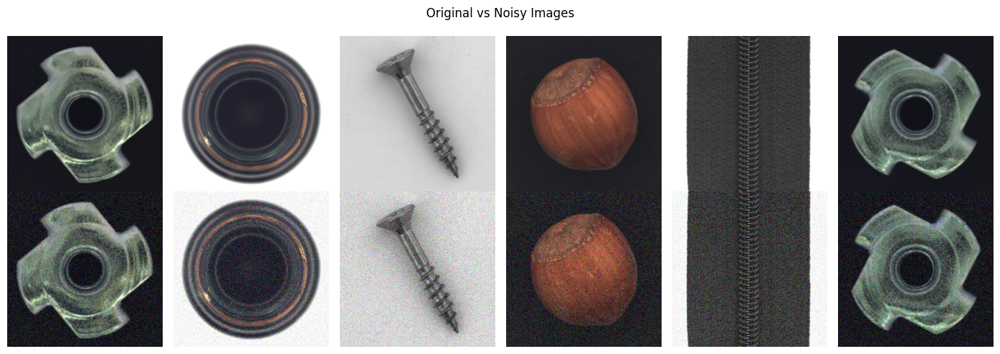

In [21]:
# =========================
# 16. Visualize Noisy Inputs
# =========================

sample_images = images[:6].to(DEVICE)
noisy_images = add_noise(sample_images, noise_factor=0.08)

sample_images_cpu = sample_images.cpu()
noisy_images_cpu = noisy_images.cpu()

plt.figure(figsize=(14, 5))

for i in range(6):
    original = sample_images_cpu[i].permute(1, 2, 0).numpy()
    noisy = noisy_images_cpu[i].permute(1, 2, 0).numpy()

    plt.subplot(2, 6, i + 1)
    plt.imshow(original)
    plt.axis("off")
    if i == 0:
        plt.ylabel("Original")

    plt.subplot(2, 6, i + 7)
    plt.imshow(noisy)
    plt.axis("off")
    if i == 0:
        plt.ylabel("Noisy")

plt.suptitle("Original vs Noisy Images")
plt.tight_layout()
plt.show()

In [22]:
# =========================
# 17. Training Hyperparameters
# =========================

NOISE_FACTOR = 0.04

criterion = nn.L1Loss()

optimizer = optim.Adam(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=1e-5
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=8
)

print("Noise factor:", NOISE_FACTOR)
print("Loss:", criterion)
print("Optimizer:", optimizer)

Noise factor: 0.04
Loss: L1Loss()
Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 1e-05
)


In [23]:
# =========================
# 18. Training and Validation Functions
# =========================

def train_one_epoch(model, loader, criterion, optimizer, device, noise_factor=0.04):
    model.train()
    running_loss = 0.0

    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        noisy_images = add_noise(images, noise_factor=noise_factor)

        optimizer.zero_grad()

        outputs = model(noisy_images)
        loss = criterion(outputs, targets)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss


def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0

    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            # Na validação usamos imagem limpa como input
            outputs = model(images)
            loss = criterion(outputs, targets)

            running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

In [24]:
# =========================
# 19. Training Loop
# =========================

history = {
    "epoch": [],
    "train_loss": [],
    "val_loss": [],
    "lr": []
}

best_val_loss = float("inf")
best_model_path = "/content/best_multi_product_dae.pt"

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(
        model=model,
        loader=train_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=DEVICE,
        noise_factor=NOISE_FACTOR
    )

    val_loss = validate_one_epoch(
        model=model,
        loader=val_loader,
        criterion=criterion,
        device=DEVICE
    )

    scheduler.step(val_loss)

    current_lr = optimizer.param_groups[0]["lr"]

    history["epoch"].append(epoch)
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["lr"].append(current_lr)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)
        status = "saved"
    else:
        status = ""

    print(
        f"Epoch [{epoch:03d}/{EPOCHS}] "
        f"Train Loss: {train_loss:.6f} | "
        f"Val Loss: {val_loss:.6f} | "
        f"LR: {current_lr:.6f} {status}"
    )

print("\nBest validation loss:", best_val_loss)
print("Best model saved at:", best_model_path)

Epoch [001/100] Train Loss: 0.075234 | Val Loss: 0.038204 | LR: 0.001000 saved
Epoch [002/100] Train Loss: 0.044335 | Val Loss: 0.049480 | LR: 0.001000 
Epoch [003/100] Train Loss: 0.037528 | Val Loss: 0.028972 | LR: 0.001000 saved
Epoch [004/100] Train Loss: 0.032869 | Val Loss: 0.025473 | LR: 0.001000 saved
Epoch [005/100] Train Loss: 0.032097 | Val Loss: 0.023175 | LR: 0.001000 saved
Epoch [006/100] Train Loss: 0.030954 | Val Loss: 0.033264 | LR: 0.001000 
Epoch [007/100] Train Loss: 0.030346 | Val Loss: 0.028957 | LR: 0.001000 
Epoch [008/100] Train Loss: 0.027931 | Val Loss: 0.029826 | LR: 0.001000 
Epoch [009/100] Train Loss: 0.027765 | Val Loss: 0.030859 | LR: 0.001000 
Epoch [010/100] Train Loss: 0.026663 | Val Loss: 0.026136 | LR: 0.001000 
Epoch [011/100] Train Loss: 0.025979 | Val Loss: 0.025511 | LR: 0.001000 
Epoch [012/100] Train Loss: 0.025017 | Val Loss: 0.020706 | LR: 0.001000 saved
Epoch [013/100] Train Loss: 0.025881 | Val Loss: 0.038043 | LR: 0.001000 
Epoch [014/10

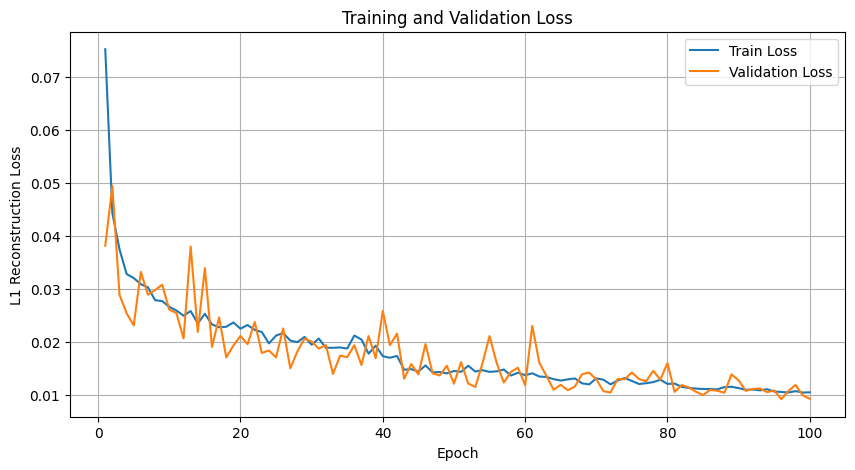

Best epoch: 96
Best train loss: 0.010638722640514449
Best val loss: 0.009265279242148003


In [25]:
# =========================
# 20. Plot Training History
# =========================

plt.figure(figsize=(10, 5))

plt.plot(history["epoch"], history["train_loss"], label="Train Loss")
plt.plot(history["epoch"], history["val_loss"], label="Validation Loss")

plt.xlabel("Epoch")
plt.ylabel("L1 Reconstruction Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

best_epoch_idx = int(np.argmin(history["val_loss"]))

print("Best epoch:", history["epoch"][best_epoch_idx])
print("Best train loss:", history["train_loss"][best_epoch_idx])
print("Best val loss:", history["val_loss"][best_epoch_idx])

In [26]:
# =========================
# 21. Load Best Model
# =========================

best_model = DenoisingConvAutoencoder(latent_channels=256).to(DEVICE)
best_model.load_state_dict(torch.load(best_model_path, map_location=DEVICE))
best_model.eval()

print("Loaded best model from:", best_model_path)

Loaded best model from: /content/best_multi_product_dae.pt


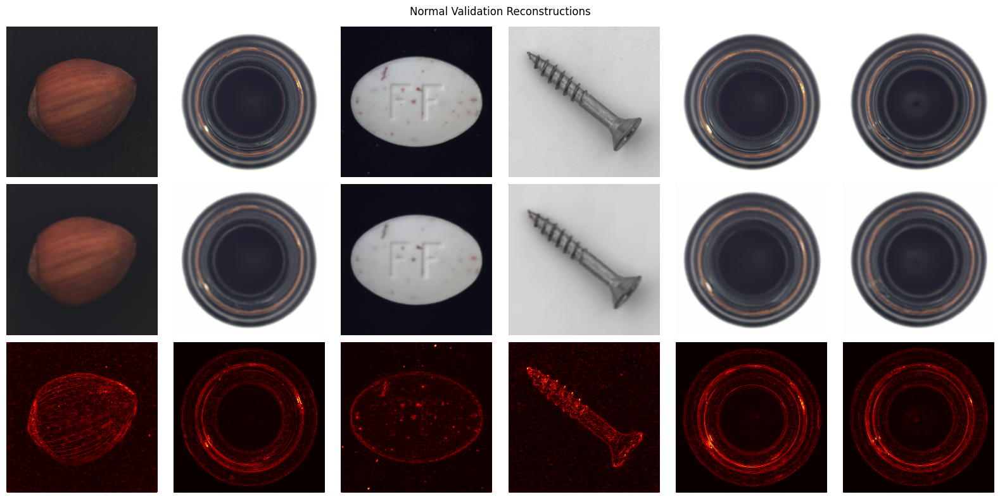

In [27]:
# =========================
# 22. Visualize Reconstructions
# =========================

def tensor_to_image(tensor):
    tensor = tensor.detach().cpu().clamp(0, 1)
    return tensor.permute(1, 2, 0).numpy()


best_model.eval()

images, targets = next(iter(val_loader))
images = images.to(DEVICE)

with torch.no_grad():
    reconstructions = best_model(images)

n = 6
plt.figure(figsize=(16, 8))

for i in range(n):
    original = tensor_to_image(images[i])
    reconstructed = tensor_to_image(reconstructions[i])
    error_map = np.mean(np.abs(original - reconstructed), axis=2)

    plt.subplot(3, n, i + 1)
    plt.imshow(original)
    plt.axis("off")
    if i == 0:
        plt.ylabel("Original")

    plt.subplot(3, n, i + 1 + n)
    plt.imshow(reconstructed)
    plt.axis("off")
    if i == 0:
        plt.ylabel("Reconstruction")

    plt.subplot(3, n, i + 1 + 2 * n)
    plt.imshow(error_map, cmap="hot")
    plt.axis("off")
    if i == 0:
        plt.ylabel("Error Map")

plt.suptitle("Normal Validation Reconstructions")
plt.tight_layout()
plt.show()

In [28]:
# =========================
# 23. Anomaly Score Function
# =========================

def compute_reconstruction_scores(model, loader, device):
    model.eval()

    scores = []
    labels = []
    categories = []
    defect_types = []
    paths = []

    with torch.no_grad():
        for batch in loader:
            images, targets, metadata = batch

            images = images.to(device)
            targets = targets.to(device)

            reconstructions = model(images)

            # erro absoluto por pixel/canal
            errors = torch.abs(targets - reconstructions)

            # score por imagem: média de todos os pixels/canais
            batch_scores = errors.mean(dim=(1, 2, 3)).detach().cpu().numpy()

            scores.extend(batch_scores.tolist())
            labels.extend(metadata["label"])
            categories.extend(metadata["category"])
            defect_types.extend(metadata["defect_type"])
            paths.extend(metadata["path"])

    return {
        "scores": np.array(scores, dtype=np.float32),
        "labels": np.array(labels, dtype=np.int64),
        "categories": np.array(categories),
        "defect_types": np.array(defect_types),
        "paths": np.array(paths)
    }

In [29]:
# =========================
# 24. Validation Scores for Threshold
# =========================

val_dataset_with_meta = MultiProductReconstructionDataset(
    val_samples,
    transform=transform,
    return_metadata=True
)

val_loader_with_meta = DataLoader(
    val_dataset_with_meta,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

val_results = compute_reconstruction_scores(
    model=best_model,
    loader=val_loader_with_meta,
    device=DEVICE
)

val_scores = val_results["scores"]

print("Validation normal scores:")
print("Min:", val_scores.min())
print("Mean:", val_scores.mean())
print("Median:", np.median(val_scores))
print("Std:", val_scores.std())
print("Max:", val_scores.max())

Validation normal scores:
Min: 0.004837264
Mean: 0.009265279
Median: 0.0071485825
Std: 0.0044224085
Max: 0.021659583


Threshold percentile: 99
Anomaly threshold: 0.02021113


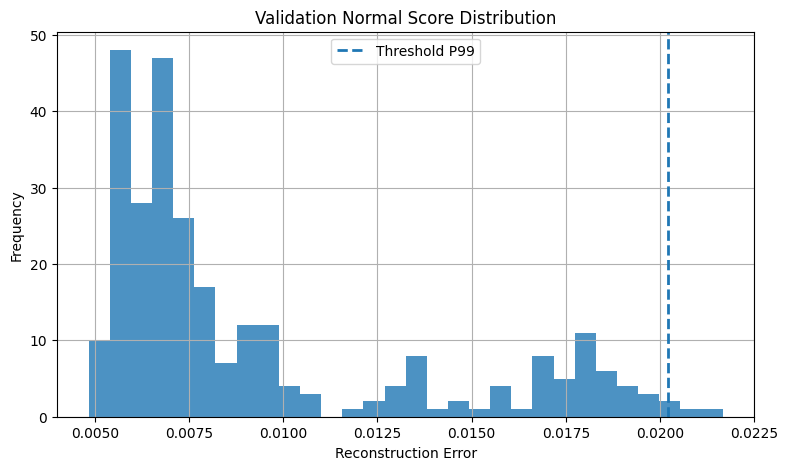

In [30]:
# =========================
# 25. Define Threshold
# =========================

THRESHOLD_PERCENTILE = 99

anomaly_threshold = np.percentile(val_scores, THRESHOLD_PERCENTILE)

print("Threshold percentile:", THRESHOLD_PERCENTILE)
print("Anomaly threshold:", anomaly_threshold)

plt.figure(figsize=(9, 5))
plt.hist(val_scores, bins=30, alpha=0.8)
plt.axvline(anomaly_threshold, linestyle="--", linewidth=2, label=f"Threshold P{THRESHOLD_PERCENTILE}")
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.title("Validation Normal Score Distribution")
plt.legend()
plt.grid(True)
plt.show()

In [31]:
# =========================
# 26. Evaluate on Test Set
# =========================

test_results = compute_reconstruction_scores(
    model=best_model,
    loader=test_loader,
    device=DEVICE
)

test_scores = test_results["scores"]
test_labels = test_results["labels"]

test_predictions = (test_scores > anomaly_threshold).astype(int)

print("ROC AUC:", roc_auc_score(test_labels, test_scores))
print("Average Precision:", average_precision_score(test_labels, test_scores))

print("\nClassification Report:")
print(classification_report(test_labels, test_predictions, target_names=["normal", "anomaly"]))

print("\nConfusion Matrix:")
print(confusion_matrix(test_labels, test_predictions))

ROC AUC: 0.5295971329708353
Average Precision: 0.7909478797884439

Classification Report:
              precision    recall  f1-score   support

      normal       0.22      1.00      0.36       204
     anomaly       1.00      0.00      0.01       714

    accuracy                           0.23       918
   macro avg       0.61      0.50      0.19       918
weighted avg       0.83      0.23      0.09       918


Confusion Matrix:
[[204   0]
 [711   3]]


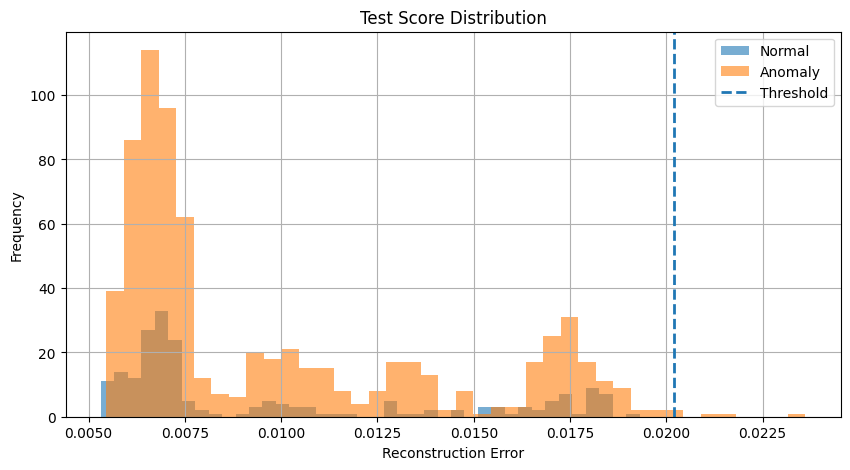

Normal mean: 0.009582405
Anomaly mean: 0.009804263
Normal max: 0.019304622
Anomaly min: 0.0054611266


In [32]:
# =========================
# 27. Score Distribution: Normal vs Anomaly
# =========================

normal_scores = test_scores[test_labels == 0]
anomaly_scores = test_scores[test_labels == 1]

plt.figure(figsize=(10, 5))

plt.hist(normal_scores, bins=40, alpha=0.6, label="Normal")
plt.hist(anomaly_scores, bins=40, alpha=0.6, label="Anomaly")
plt.axvline(anomaly_threshold, linestyle="--", linewidth=2, label="Threshold")

plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.title("Test Score Distribution")
plt.legend()
plt.grid(True)
plt.show()

print("Normal mean:", normal_scores.mean())
print("Anomaly mean:", anomaly_scores.mean())
print("Normal max:", normal_scores.max())
print("Anomaly min:", anomaly_scores.min())

In [33]:
# =========================
# 28. Heatmap, Mask and Bounding Boxes
# =========================

def generate_anomaly_visualization(
    model,
    sample,
    transform,
    device,
    image_threshold,
    pixel_percentile=99.5,
    min_area=80
):
    model.eval()

    image_pil = Image.open(sample["path"]).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        reconstruction = model(image_tensor)

    original = image_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
    reconstructed = reconstruction[0].detach().cpu().permute(1, 2, 0).numpy()

    error_map = np.mean(np.abs(original - reconstructed), axis=2)
    image_score = float(error_map.mean())

    is_anomaly = image_score > image_threshold

    # threshold local para máscara
    pixel_threshold = np.percentile(error_map, pixel_percentile)
    mask = (error_map > pixel_threshold).astype(np.uint8) * 255

    # pós-processamento
    kernel = np.ones((5, 5), np.uint8)
    mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask_clean = cv2.morphologyEx(mask_clean, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    boxes = []
    overlay = (original * 255).astype(np.uint8).copy()

    for contour in contours:
        area = cv2.contourArea(contour)

        if area < min_area:
            continue

        x, y, w, h = cv2.boundingRect(contour)
        boxes.append({
            "x": int(x),
            "y": int(y),
            "w": int(w),
            "h": int(h),
            "area": float(area)
        })

        cv2.rectangle(overlay, (x, y), (x + w, y + h), (255, 0, 0), 2)

    return {
        "original": original,
        "reconstructed": reconstructed,
        "error_map": error_map,
        "mask": mask_clean,
        "overlay": overlay,
        "score": image_score,
        "is_anomaly": is_anomaly,
        "boxes": boxes,
        "category": sample["category"],
        "label": sample["label"],
        "defect_type": sample["defect_type"],
        "path": str(sample["path"])
    }

Category: hazelnut
Defect type: print
Score: 0.011006614193320274
Threshold: 0.02021113
Predicted anomaly: False
Boxes: []


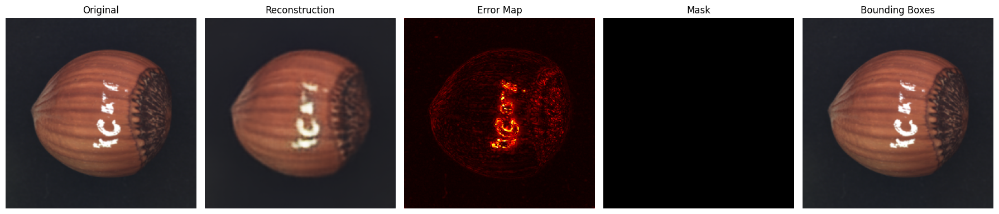

In [34]:
# =========================
# 29. Visualize One Anomaly with Bounding Boxes
# =========================

# escolhe uma imagem anômala aleatória
anomaly_samples = [s for s in all_test_samples if s["label"] == 1]
sample = random.choice(anomaly_samples)

viz = generate_anomaly_visualization(
    model=best_model,
    sample=sample,
    transform=transform,
    device=DEVICE,
    image_threshold=anomaly_threshold,
    pixel_percentile=99.5,
    min_area=80
)

print("Category:", viz["category"])
print("Defect type:", viz["defect_type"])
print("Score:", viz["score"])
print("Threshold:", anomaly_threshold)
print("Predicted anomaly:", viz["is_anomaly"])
print("Boxes:", viz["boxes"])

plt.figure(figsize=(18, 6))

plt.subplot(1, 5, 1)
plt.imshow(viz["original"])
plt.title("Original")
plt.axis("off")

plt.subplot(1, 5, 2)
plt.imshow(viz["reconstructed"])
plt.title("Reconstruction")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(viz["error_map"], cmap="hot")
plt.title("Error Map")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(viz["mask"], cmap="gray")
plt.title("Mask")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(viz["overlay"])
plt.title("Bounding Boxes")
plt.axis("off")

plt.tight_layout()
plt.show()

In [35]:
# =========================
# 30. Improved Anomaly Scores: Mean and Top-K
# =========================

def compute_reconstruction_scores_v2(model, loader, device, topk_percentages=(1, 5)):
    model.eval()

    results = {
        "mean_score": [],
        "max_score": [],
        "labels": [],
        "categories": [],
        "defect_types": [],
        "paths": []
    }

    for topk in topk_percentages:
        results[f"top_{topk}_score"] = []

    with torch.no_grad():
        for batch in loader:
            images, targets, metadata = batch

            images = images.to(device)
            targets = targets.to(device)

            reconstructions = model(images)

            # [B, C, H, W] -> [B, H, W]
            error_maps = torch.mean(torch.abs(targets - reconstructions), dim=1)

            batch_size = error_maps.shape[0]
            flat_errors = error_maps.view(batch_size, -1)

            mean_scores = flat_errors.mean(dim=1)
            max_scores = flat_errors.max(dim=1).values

            results["mean_score"].extend(mean_scores.detach().cpu().numpy().tolist())
            results["max_score"].extend(max_scores.detach().cpu().numpy().tolist())

            for topk in topk_percentages:
                k = max(1, int(flat_errors.shape[1] * (topk / 100)))
                topk_values = torch.topk(flat_errors, k=k, dim=1).values
                topk_scores = topk_values.mean(dim=1)
                results[f"top_{topk}_score"].extend(topk_scores.detach().cpu().numpy().tolist())

            results["labels"].extend(metadata["label"])
            results["categories"].extend(metadata["category"])
            results["defect_types"].extend(metadata["defect_type"])
            results["paths"].extend(metadata["path"])

    for key in results:
        results[key] = np.array(results[key])

    results["labels"] = results["labels"].astype(np.int64)

    return results

In [36]:
# =========================
# 31. Compute Improved Validation and Test Scores
# =========================

val_results_v2 = compute_reconstruction_scores_v2(
    model=best_model,
    loader=val_loader_with_meta,
    device=DEVICE,
    topk_percentages=(1, 5)
)

test_results_v2 = compute_reconstruction_scores_v2(
    model=best_model,
    loader=test_loader,
    device=DEVICE,
    topk_percentages=(1, 5)
)

score_names = ["mean_score", "top_1_score", "top_5_score", "max_score"]

for score_name in score_names:
    val_scores = val_results_v2[score_name]
    test_scores = test_results_v2[score_name]
    test_labels = test_results_v2["labels"]

    auc = roc_auc_score(test_labels, test_scores)
    ap = average_precision_score(test_labels, test_scores)

    print("=" * 60)
    print("Score:", score_name)
    print("Validation mean:", val_scores.mean())
    print("Validation P95:", np.percentile(val_scores, 95))
    print("Validation P99:", np.percentile(val_scores, 99))
    print("Test ROC AUC:", auc)
    print("Test Average Precision:", ap)

Score: mean_score
Validation mean: 0.009265279131991568
Validation P95: 0.01851260811090469
Validation P99: 0.02021112792193889
Test ROC AUC: 0.5295971329708353
Test Average Precision: 0.7909478797884439
Score: top_1_score
Validation mean: 0.07424873286544421
Validation P95: 0.12100232616066932
Validation P99: 0.13489772558212265
Test ROC AUC: 0.5800996869335969
Test Average Precision: 0.8274210044522432
Score: top_5_score
Validation mean: 0.04530537160493994
Validation P95: 0.07679017111659048
Validation P99: 0.0817172662913799
Test ROC AUC: 0.5545806557917284
Test Average Precision: 0.8036442012044124
Score: max_score
Validation mean: 0.2016710612562395
Validation P95: 0.3494368791580199
Validation P99: 0.42388628721237137
Test ROC AUC: 0.6015543472290876
Test Average Precision: 0.8437585661772614


In [37]:
# =========================
# 32. Global Threshold with Top-K Score
# =========================

SELECTED_SCORE = "top_1_score"
THRESHOLD_PERCENTILE = 99

val_scores_selected = val_results_v2[SELECTED_SCORE]
test_scores_selected = test_results_v2[SELECTED_SCORE]
test_labels = test_results_v2["labels"]

global_threshold = np.percentile(val_scores_selected, THRESHOLD_PERCENTILE)

predictions = (test_scores_selected > global_threshold).astype(int)

print("Selected score:", SELECTED_SCORE)
print("Global threshold:", global_threshold)
print("ROC AUC:", roc_auc_score(test_labels, test_scores_selected))
print("Average Precision:", average_precision_score(test_labels, test_scores_selected))

print("\nClassification Report:")
print(classification_report(test_labels, predictions, target_names=["normal", "anomaly"]))

print("\nConfusion Matrix:")
print(confusion_matrix(test_labels, predictions))

Selected score: top_1_score
Global threshold: 0.13489772558212265
ROC AUC: 0.5800996869335969
Average Precision: 0.8274210044522432

Classification Report:
              precision    recall  f1-score   support

      normal       0.23      0.98      0.37       204
     anomaly       0.92      0.07      0.13       714

    accuracy                           0.27       918
   macro avg       0.58      0.52      0.25       918
weighted avg       0.77      0.27      0.18       918


Confusion Matrix:
[[200   4]
 [665  49]]


In [38]:
# =========================
# 33. Category-Specific Thresholds
# =========================

SELECTED_SCORE = "top_1_score"
THRESHOLD_PERCENTILE = 99

category_thresholds = {}

for category in SELECTED_CATEGORIES:
    category_mask = val_results_v2["categories"] == category
    category_scores = val_results_v2[SELECTED_SCORE][category_mask]

    if len(category_scores) == 0:
        continue

    threshold = np.percentile(category_scores, THRESHOLD_PERCENTILE)
    category_thresholds[category] = threshold

    print(
        f"{category:10s} | "
        f"n={len(category_scores):3d} | "
        f"mean={category_scores.mean():.6f} | "
        f"P99={threshold:.6f} | "
        f"max={category_scores.max():.6f}"
    )

bottle     | n= 33 | mean=0.095213 | P99=0.124848 | max=0.127054
capsule    | n= 27 | mean=0.047119 | P99=0.063400 | max=0.063495
hazelnut   | n= 60 | mean=0.046511 | P99=0.074970 | max=0.083800
metal_nut  | n= 23 | mean=0.100365 | P99=0.121424 | max=0.121517
pill       | n= 41 | mean=0.049639 | P99=0.061742 | max=0.063005
screw      | n= 53 | mean=0.080075 | P99=0.099768 | max=0.103280
zipper     | n= 42 | mean=0.117213 | P99=0.156754 | max=0.157002


In [39]:
# =========================
# 34. Evaluate with Category-Specific Thresholds
# =========================

test_scores = test_results_v2[SELECTED_SCORE]
test_labels = test_results_v2["labels"]
test_categories = test_results_v2["categories"]

category_predictions = []

for score, category in zip(test_scores, test_categories):
    threshold = category_thresholds[category]
    pred = int(score > threshold)
    category_predictions.append(pred)

category_predictions = np.array(category_predictions)

print("Selected score:", SELECTED_SCORE)
print("Threshold percentile:", THRESHOLD_PERCENTILE)
print("ROC AUC:", roc_auc_score(test_labels, test_scores))
print("Average Precision:", average_precision_score(test_labels, test_scores))

print("\nClassification Report:")
print(classification_report(test_labels, category_predictions, target_names=["normal", "anomaly"]))

print("\nConfusion Matrix:")
print(confusion_matrix(test_labels, category_predictions))

Selected score: top_1_score
Threshold percentile: 99
ROC AUC: 0.5800996869335969
Average Precision: 0.8274210044522432

Classification Report:
              precision    recall  f1-score   support

      normal       0.23      0.95      0.38       204
     anomaly       0.88      0.12      0.21       714

    accuracy                           0.30       918
   macro avg       0.56      0.53      0.29       918
weighted avg       0.74      0.30      0.25       918


Confusion Matrix:
[[193  11]
 [630  84]]


In [40]:
# =========================
# 35. Metrics by Category
# =========================

for category in SELECTED_CATEGORIES:
    mask = test_results_v2["categories"] == category

    y_true = test_results_v2["labels"][mask]
    y_score = test_results_v2[SELECTED_SCORE][mask]

    y_pred = []
    for score in y_score:
        y_pred.append(int(score > category_thresholds[category]))

    y_pred = np.array(y_pred)

    print("=" * 70)
    print("Category:", category)
    print("Samples:", len(y_true))

    if len(np.unique(y_true)) > 1:
        print("ROC AUC:", roc_auc_score(y_true, y_score))
        print("Average Precision:", average_precision_score(y_true, y_score))

    print(confusion_matrix(y_true, y_pred))
    print(classification_report(y_true, y_pred, target_names=["normal", "anomaly"]))

Category: bottle
Samples: 83
ROC AUC: 0.6492063492063492
Average Precision: 0.8683723209249075
[[20  0]
 [50 13]]
              precision    recall  f1-score   support

      normal       0.29      1.00      0.44        20
     anomaly       1.00      0.21      0.34        63

    accuracy                           0.40        83
   macro avg       0.64      0.60      0.39        83
weighted avg       0.83      0.40      0.37        83

Category: capsule
Samples: 132
ROC AUC: 0.5767850019944156
Average Precision: 0.8445092273357622
[[ 20   3]
 [102   7]]
              precision    recall  f1-score   support

      normal       0.16      0.87      0.28        23
     anomaly       0.70      0.06      0.12       109

    accuracy                           0.20       132
   macro avg       0.43      0.47      0.20       132
weighted avg       0.61      0.20      0.15       132

Category: hazelnut
Samples: 110
ROC AUC: 0.8942857142857142
Average Precision: 0.9371758504105829
[[40  0]
 [40 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [41]:
# =========================
# 36. Compare Category Threshold Percentiles
# =========================

SELECTED_SCORE = "top_1_score"
percentiles_to_test = [85, 90, 95, 97, 99]

for percentile in percentiles_to_test:
    category_thresholds_temp = {}

    for category in SELECTED_CATEGORIES:
        category_mask = val_results_v2["categories"] == category
        category_scores = val_results_v2[SELECTED_SCORE][category_mask]
        category_thresholds_temp[category] = np.percentile(category_scores, percentile)

    preds = []

    for score, category in zip(test_results_v2[SELECTED_SCORE], test_results_v2["categories"]):
        preds.append(int(score > category_thresholds_temp[category]))

    preds = np.array(preds)
    y_true = test_results_v2["labels"]

    print("=" * 80)
    print(f"Percentile: P{percentile}")
    print(confusion_matrix(y_true, preds))
    print(classification_report(
        y_true,
        preds,
        target_names=["normal", "anomaly"],
        zero_division=0
    ))

Percentile: P85
[[174  30]
 [501 213]]
              precision    recall  f1-score   support

      normal       0.26      0.85      0.40       204
     anomaly       0.88      0.30      0.45       714

    accuracy                           0.42       918
   macro avg       0.57      0.58      0.42       918
weighted avg       0.74      0.42      0.43       918

Percentile: P90
[[177  27]
 [522 192]]
              precision    recall  f1-score   support

      normal       0.25      0.87      0.39       204
     anomaly       0.88      0.27      0.41       714

    accuracy                           0.40       918
   macro avg       0.56      0.57      0.40       918
weighted avg       0.74      0.40      0.41       918

Percentile: P95
[[187  17]
 [576 138]]
              precision    recall  f1-score   support

      normal       0.25      0.92      0.39       204
     anomaly       0.89      0.19      0.32       714

    accuracy                           0.35       918
   macro av

In [42]:
# =========================
# 37. Category Thresholds with P95
# =========================

SELECTED_SCORE = "top_1_score"
THRESHOLD_PERCENTILE = 95

category_thresholds = {}

for category in SELECTED_CATEGORIES:
    category_mask = val_results_v2["categories"] == category
    category_scores = val_results_v2[SELECTED_SCORE][category_mask]

    threshold = np.percentile(category_scores, THRESHOLD_PERCENTILE)
    category_thresholds[category] = threshold

    print(
        f"{category:10s} | "
        f"n={len(category_scores):3d} | "
        f"mean={category_scores.mean():.6f} | "
        f"P{THRESHOLD_PERCENTILE}={threshold:.6f} | "
        f"max={category_scores.max():.6f}"
    )

bottle     | n= 33 | mean=0.095213 | P95=0.118725 | max=0.127054
capsule    | n= 27 | mean=0.047119 | P95=0.061795 | max=0.063495
hazelnut   | n= 60 | mean=0.046511 | P95=0.061386 | max=0.083800
metal_nut  | n= 23 | mean=0.100365 | P95=0.121040 | max=0.121517
pill       | n= 41 | mean=0.049639 | P95=0.059406 | max=0.063005
screw      | n= 53 | mean=0.080075 | P95=0.087707 | max=0.103280
zipper     | n= 42 | mean=0.117213 | P95=0.138693 | max=0.157002


In [43]:
# =========================
# 38. Evaluate with Category-Specific P95 Thresholds
# =========================

test_scores = test_results_v2[SELECTED_SCORE]
test_labels = test_results_v2["labels"]
test_categories = test_results_v2["categories"]

predictions_p95 = []

for score, category in zip(test_scores, test_categories):
    threshold = category_thresholds[category]
    predictions_p95.append(int(score > threshold))

predictions_p95 = np.array(predictions_p95)

print("Selected score:", SELECTED_SCORE)
print("Threshold percentile:", THRESHOLD_PERCENTILE)
print("ROC AUC:", roc_auc_score(test_labels, test_scores))
print("Average Precision:", average_precision_score(test_labels, test_scores))

print("\nClassification Report:")
print(classification_report(
    test_labels,
    predictions_p95,
    target_names=["normal", "anomaly"],
    zero_division=0
))

print("\nConfusion Matrix:")
print(confusion_matrix(test_labels, predictions_p95))

Selected score: top_1_score
Threshold percentile: 95
ROC AUC: 0.5800996869335969
Average Precision: 0.8274210044522432

Classification Report:
              precision    recall  f1-score   support

      normal       0.25      0.92      0.39       204
     anomaly       0.89      0.19      0.32       714

    accuracy                           0.35       918
   macro avg       0.57      0.55      0.35       918
weighted avg       0.75      0.35      0.33       918


Confusion Matrix:
[[187  17]
 [576 138]]


In [44]:
# =========================
# 39. Generate Bounding Boxes from Error Map
# =========================

def generate_boxes_from_error_map(
    model,
    sample,
    transform,
    device,
    pixel_percentile=98.0,
    min_area=15,
    kernel_size=3
):
    model.eval()

    image_pil = Image.open(sample["path"]).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        reconstruction = model(image_tensor)

    original = image_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
    reconstructed = reconstruction[0].detach().cpu().permute(1, 2, 0).numpy()

    error_map = np.mean(np.abs(original - reconstructed), axis=2)

    pixel_threshold = np.percentile(error_map, pixel_percentile)
    mask = (error_map > pixel_threshold).astype(np.uint8) * 255

    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # Para defeitos finos, CLOSE é menos destrutivo que OPEN
    mask_clean = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(
        mask_clean,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    overlay = (original * 255).astype(np.uint8).copy()
    boxes = []

    for contour in contours:
        area = cv2.contourArea(contour)

        if area < min_area:
            continue

        x, y, w, h = cv2.boundingRect(contour)

        boxes.append({
            "x": int(x),
            "y": int(y),
            "w": int(w),
            "h": int(h),
            "area": float(area)
        })

        cv2.rectangle(
            overlay,
            (x, y),
            (x + w, y + h),
            (255, 0, 0),
            2
        )

    return {
        "original": original,
        "reconstructed": reconstructed,
        "error_map": error_map,
        "mask": mask_clean,
        "overlay": overlay,
        "boxes": boxes,
        "category": sample["category"],
        "label": sample["label"],
        "defect_type": sample["defect_type"],
        "path": str(sample["path"])
    }

Category: pill
Defect type: scratch
Boxes: [{'x': 72, 'y': 187, 'w': 15, 'h': 10, 'area': 45.5}, {'x': 166, 'y': 183, 'w': 8, 'h': 11, 'area': 24.0}, {'x': 107, 'y': 179, 'w': 12, 'h': 11, 'area': 61.5}, {'x': 96, 'y': 176, 'w': 11, 'h': 8, 'area': 24.0}, {'x': 201, 'y': 166, 'w': 9, 'h': 11, 'area': 17.5}, {'x': 104, 'y': 165, 'w': 28, 'h': 11, 'area': 61.0}, {'x': 27, 'y': 160, 'w': 36, 'h': 30, 'area': 33.0}, {'x': 191, 'y': 97, 'w': 9, 'h': 9, 'area': 30.5}, {'x': 223, 'y': 90, 'w': 12, 'h': 16, 'area': 20.0}, {'x': 32, 'y': 81, 'w': 10, 'h': 11, 'area': 17.0}, {'x': 106, 'y': 65, 'w': 11, 'h': 12, 'area': 44.5}, {'x': 182, 'y': 62, 'w': 41, 'h': 27, 'area': 120.0}, {'x': 132, 'y': 51, 'w': 21, 'h': 4, 'area': 17.5}, {'x': 91, 'y': 51, 'w': 28, 'h': 7, 'area': 35.0}]


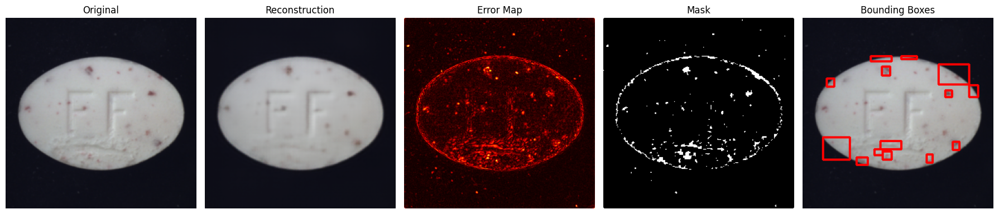

Category: pill
Defect type: color
Boxes: [{'x': 215, 'y': 162, 'w': 14, 'h': 12, 'area': 21.5}, {'x': 28, 'y': 158, 'w': 25, 'h': 25, 'area': 50.5}, {'x': 229, 'y': 142, 'w': 10, 'h': 18, 'area': 30.5}, {'x': 16, 'y': 133, 'w': 11, 'h': 23, 'area': 30.5}, {'x': 51, 'y': 121, 'w': 11, 'h': 8, 'area': 26.5}, {'x': 180, 'y': 108, 'w': 22, 'h': 24, 'area': 369.0}, {'x': 48, 'y': 104, 'w': 9, 'h': 10, 'area': 16.5}, {'x': 16, 'y': 82, 'w': 28, 'h': 42, 'area': 60.5}, {'x': 44, 'y': 75, 'w': 8, 'h': 7, 'area': 18.0}, {'x': 169, 'y': 68, 'w': 12, 'h': 10, 'area': 47.5}, {'x': 144, 'y': 64, 'w': 8, 'h': 12, 'area': 33.0}]


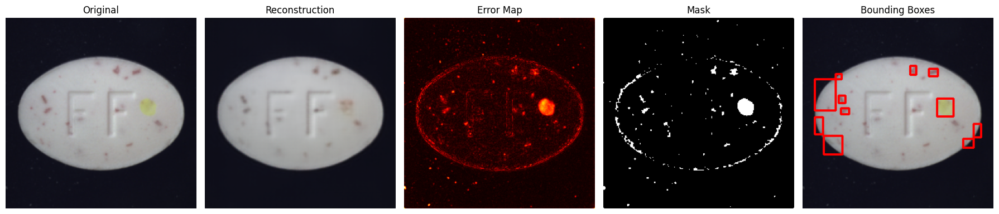

Category: bottle
Defect type: broken_small
Boxes: [{'x': 121, 'y': 199, 'w': 45, 'h': 10, 'area': 44.5}, {'x': 158, 'y': 172, 'w': 28, 'h': 25, 'area': 67.0}, {'x': 43, 'y': 156, 'w': 46, 'h': 41, 'area': 262.5}, {'x': 210, 'y': 135, 'w': 12, 'h': 16, 'area': 55.5}, {'x': 215, 'y': 116, 'w': 6, 'h': 15, 'area': 26.0}, {'x': 36, 'y': 104, 'w': 5, 'h': 24, 'area': 20.0}, {'x': 180, 'y': 100, 'w': 19, 'h': 40, 'area': 183.0}, {'x': 197, 'y': 68, 'w': 22, 'h': 55, 'area': 261.5}, {'x': 120, 'y': 36, 'w': 19, 'h': 5, 'area': 30.5}]


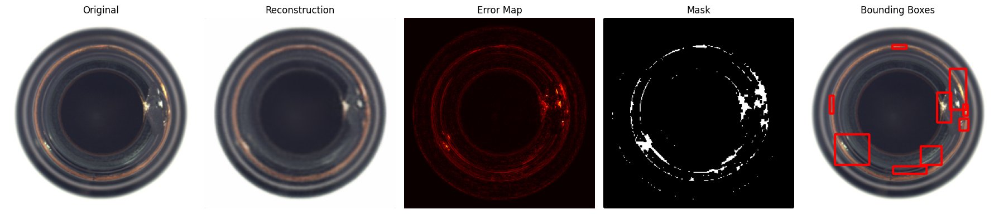

Category: pill
Defect type: faulty_imprint
Boxes: [{'x': 33, 'y': 168, 'w': 28, 'h': 19, 'area': 58.5}, {'x': 124, 'y': 163, 'w': 10, 'h': 10, 'area': 42.5}, {'x': 87, 'y': 145, 'w': 6, 'h': 10, 'area': 16.5}, {'x': 219, 'y': 123, 'w': 16, 'h': 12, 'area': 44.0}, {'x': 64, 'y': 117, 'w': 6, 'h': 11, 'area': 18.5}, {'x': 144, 'y': 114, 'w': 21, 'h': 15, 'area': 29.5}, {'x': 84, 'y': 111, 'w': 8, 'h': 7, 'area': 25.5}, {'x': 230, 'y': 102, 'w': 7, 'h': 7, 'area': 19.5}, {'x': 163, 'y': 99, 'w': 12, 'h': 8, 'area': 45.5}, {'x': 215, 'y': 98, 'w': 9, 'h': 5, 'area': 18.5}, {'x': 53, 'y': 82, 'w': 12, 'h': 8, 'area': 48.0}, {'x': 204, 'y': 75, 'w': 17, 'h': 12, 'area': 22.0}, {'x': 93, 'y': 72, 'w': 8, 'h': 9, 'area': 31.5}, {'x': 16, 'y': 52, 'w': 95, 'h': 107, 'area': 269.0}, {'x': 113, 'y': 51, 'w': 21, 'h': 5, 'area': 23.5}]


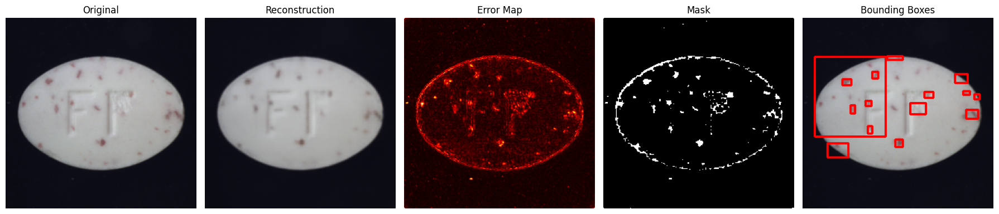

Category: bottle
Defect type: contamination
Boxes: [{'x': 173, 'y': 199, 'w': 16, 'h': 15, 'area': 39.5}, {'x': 190, 'y': 190, 'w': 11, 'h': 10, 'area': 23.5}, {'x': 44, 'y': 160, 'w': 128, 'h': 65, 'area': 652.5}, {'x': 202, 'y': 78, 'w': 21, 'h': 77, 'area': 229.0}, {'x': 99, 'y': 40, 'w': 72, 'h': 14, 'area': 100.5}]


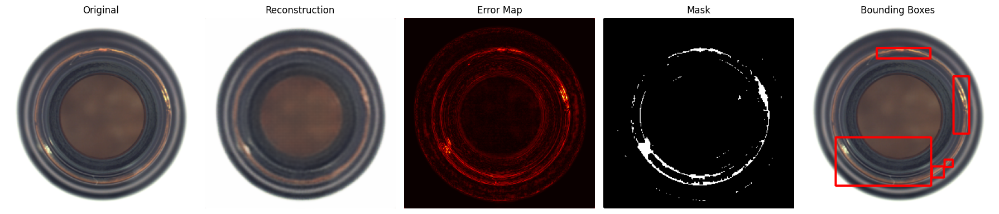

Category: pill
Defect type: crack
Boxes: [{'x': 149, 'y': 186, 'w': 45, 'h': 18, 'area': 132.5}, {'x': 28, 'y': 164, 'w': 21, 'h': 16, 'area': 23.5}, {'x': 30, 'y': 141, 'w': 17, 'h': 17, 'area': 153.0}, {'x': 231, 'y': 136, 'w': 8, 'h': 21, 'area': 21.0}, {'x': 227, 'y': 115, 'w': 12, 'h': 10, 'area': 35.5}, {'x': 199, 'y': 101, 'w': 6, 'h': 9, 'area': 16.0}, {'x': 161, 'y': 81, 'w': 11, 'h': 12, 'area': 51.5}, {'x': 68, 'y': 53, 'w': 37, 'h': 14, 'area': 45.5}, {'x': 135, 'y': 51, 'w': 90, 'h': 41, 'area': 150.5}, {'x': 108, 'y': 50, 'w': 26, 'h': 6, 'area': 44.0}]


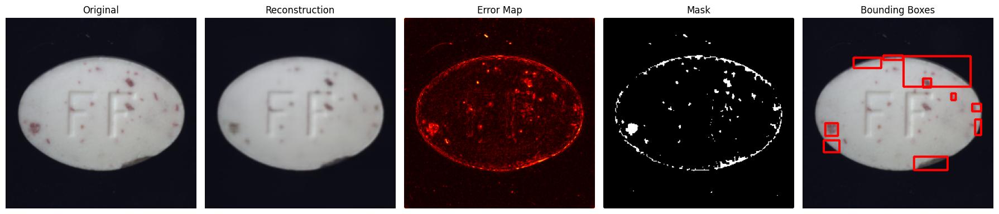

Category: screw
Defect type: scratch_head
Boxes: [{'x': 102, 'y': 148, 'w': 28, 'h': 10, 'area': 23.5}, {'x': 14, 'y': 140, 'w': 11, 'h': 6, 'area': 16.0}, {'x': 162, 'y': 138, 'w': 79, 'h': 42, 'area': 607.5}, {'x': 134, 'y': 130, 'w': 30, 'h': 24, 'area': 151.0}, {'x': 122, 'y': 127, 'w': 13, 'h': 21, 'area': 49.0}, {'x': 17, 'y': 73, 'w': 33, 'h': 62, 'area': 346.5}]


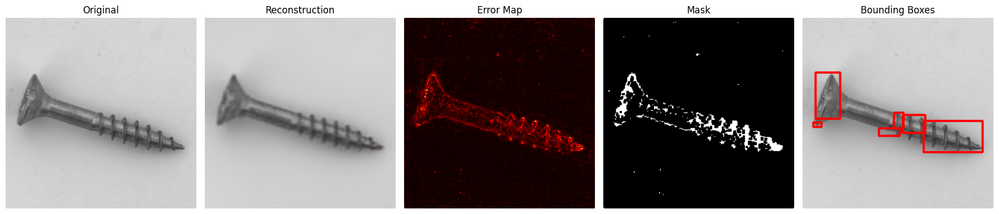

Category: pill
Defect type: contamination
Boxes: [{'x': 113, 'y': 196, 'w': 25, 'h': 10, 'area': 21.0}, {'x': 50, 'y': 180, 'w': 26, 'h': 15, 'area': 38.5}, {'x': 196, 'y': 167, 'w': 28, 'h': 20, 'area': 38.5}, {'x': 28, 'y': 159, 'w': 9, 'h': 12, 'area': 17.0}, {'x': 205, 'y': 152, 'w': 9, 'h': 12, 'area': 46.5}, {'x': 146, 'y': 143, 'w': 8, 'h': 9, 'area': 18.0}, {'x': 236, 'y': 127, 'w': 4, 'h': 13, 'area': 25.0}, {'x': 139, 'y': 126, 'w': 24, 'h': 12, 'area': 54.0}, {'x': 68, 'y': 119, 'w': 15, 'h': 10, 'area': 39.0}, {'x': 156, 'y': 103, 'w': 7, 'h': 7, 'area': 18.0}, {'x': 96, 'y': 102, 'w': 5, 'h': 9, 'area': 18.5}, {'x': 171, 'y': 101, 'w': 5, 'h': 10, 'area': 20.0}, {'x': 85, 'y': 77, 'w': 29, 'h': 13, 'area': 78.5}, {'x': 60, 'y': 50, 'w': 151, 'h': 30, 'area': 265.0}]


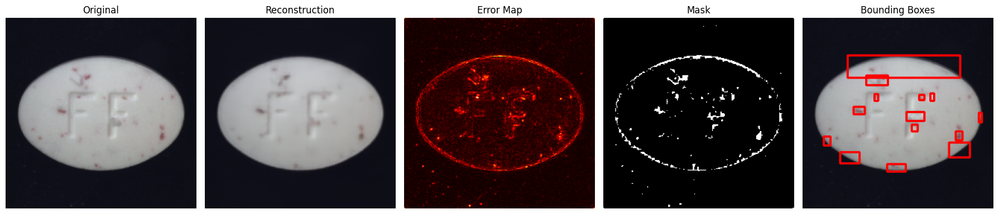

In [45]:
# =========================
# 40. Visualize Anomaly Bounding Boxes
# =========================

anomaly_samples = [s for s in all_test_samples if s["label"] == 1]

selected_samples = random.sample(anomaly_samples, 8)

for sample in selected_samples:
    viz = generate_boxes_from_error_map(
        model=best_model,
        sample=sample,
        transform=transform,
        device=DEVICE,
        pixel_percentile=98.0,
        min_area=15,
        kernel_size=3
    )

    print("=" * 80)
    print("Category:", viz["category"])
    print("Defect type:", viz["defect_type"])
    print("Boxes:", viz["boxes"])

    plt.figure(figsize=(18, 4))

    plt.subplot(1, 5, 1)
    plt.imshow(viz["original"])
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(viz["reconstructed"])
    plt.title("Reconstruction")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(viz["error_map"], cmap="hot")
    plt.title("Error Map")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(viz["mask"], cmap="gray")
    plt.title("Mask")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(viz["overlay"])
    plt.title("Bounding Boxes")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [46]:
# =========================
# 41. Build Category Normal Error Profiles
# =========================

def compute_error_map_for_sample(model, sample, transform, device):
    model.eval()

    image_pil = Image.open(sample["path"]).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        reconstruction = model(image_tensor)

    original = image_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
    reconstructed = reconstruction[0].detach().cpu().permute(1, 2, 0).numpy()

    error_map = np.mean(np.abs(original - reconstructed), axis=2)

    return error_map


category_error_profiles = {}

for category in SELECTED_CATEGORIES:
    category_val_samples = [
        s for s in val_samples
        if s["category"] == category
    ]

    error_maps = []

    for sample in category_val_samples:
        error_map = compute_error_map_for_sample(
            model=best_model,
            sample=sample,
            transform=transform,
            device=DEVICE
        )
        error_maps.append(error_map)

    error_maps = np.stack(error_maps, axis=0)

    category_error_profiles[category] = {
        "mean": error_maps.mean(axis=0),
        "std": error_maps.std(axis=0) + 1e-6
    }

    print(
        f"{category:10s} | "
        f"samples={len(category_val_samples):3d} | "
        f"mean error={error_maps.mean():.6f} | "
        f"std error={error_maps.std():.6f}"
    )

bottle     | samples= 33 | mean error=0.009470 | std error=0.014691
capsule    | samples= 27 | mean error=0.006893 | std error=0.006125
hazelnut   | samples= 60 | mean error=0.006273 | std error=0.007215
metal_nut  | samples= 23 | mean error=0.013827 | std error=0.017511
pill       | samples= 41 | mean error=0.005936 | std error=0.006913
screw      | samples= 53 | mean error=0.007179 | std error=0.011001
zipper     | samples= 42 | mean error=0.018289 | std error=0.019860


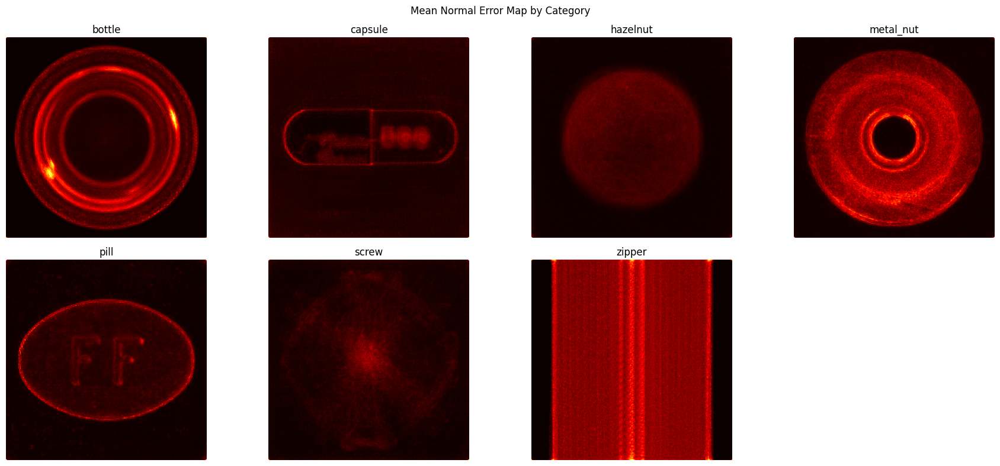

In [47]:
# =========================
# 42. Visualize Category Normal Error Profiles
# =========================

plt.figure(figsize=(18, 8))

for i, category in enumerate(SELECTED_CATEGORIES):
    mean_map = category_error_profiles[category]["mean"]

    plt.subplot(2, 4, i + 1)
    plt.imshow(mean_map, cmap="hot")
    plt.title(category)
    plt.axis("off")

plt.suptitle("Mean Normal Error Map by Category")
plt.tight_layout()
plt.show()

In [48]:
# =========================
# 43. Generate Boxes Using Category-Normalized Error Map
# =========================

def generate_boxes_with_category_profile(
    model,
    sample,
    transform,
    device,
    category_error_profiles,
    z_percentile=99.0,
    min_area=30,
    kernel_size=3,
    max_boxes=5
):
    model.eval()

    image_pil = Image.open(sample["path"]).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        reconstruction = model(image_tensor)

    original = image_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
    reconstructed = reconstruction[0].detach().cpu().permute(1, 2, 0).numpy()

    error_map = np.mean(np.abs(original - reconstructed), axis=2)

    category = sample["category"]

    normal_mean = category_error_profiles[category]["mean"]
    normal_std = category_error_profiles[category]["std"]

    # Z-score: erro acima do padrão normal daquela categoria
    z_map = (error_map - normal_mean) / normal_std

    # Remove valores negativos: só queremos erro acima do normal esperado
    z_map = np.clip(z_map, 0, None)

    # Suaviza para reduzir ruído pontual
    z_map_smooth = cv2.GaussianBlur(z_map.astype(np.float32), (5, 5), 0)

    threshold = np.percentile(z_map_smooth, z_percentile)
    mask = (z_map_smooth > threshold).astype(np.uint8) * 255

    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    mask_clean = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(
        mask_clean,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []

    for contour in contours:
        area = cv2.contourArea(contour)

        if area < min_area:
            continue

        x, y, w, h = cv2.boundingRect(contour)

        boxes.append({
            "x": int(x),
            "y": int(y),
            "w": int(w),
            "h": int(h),
            "area": float(area)
        })

    # Mantém as maiores boxes
    boxes = sorted(boxes, key=lambda b: b["area"], reverse=True)[:max_boxes]

    overlay = (original * 255).astype(np.uint8).copy()

    for box in boxes:
        x, y, w, h = box["x"], box["y"], box["w"], box["h"]

        cv2.rectangle(
            overlay,
            (x, y),
            (x + w, y + h),
            (255, 0, 0),
            2
        )

    return {
        "original": original,
        "reconstructed": reconstructed,
        "error_map": error_map,
        "z_map": z_map_smooth,
        "mask": mask_clean,
        "overlay": overlay,
        "boxes": boxes,
        "category": sample["category"],
        "label": sample["label"],
        "defect_type": sample["defect_type"],
        "path": str(sample["path"])
    }

Category: hazelnut
Defect type: print
Boxes: [{'x': 92, 'y': 89, 'w': 45, 'h': 33, 'area': 277.5}, {'x': 139, 'y': 97, 'w': 17, 'h': 16, 'area': 94.5}, {'x': 74, 'y': 101, 'w': 12, 'h': 22, 'area': 67.0}]


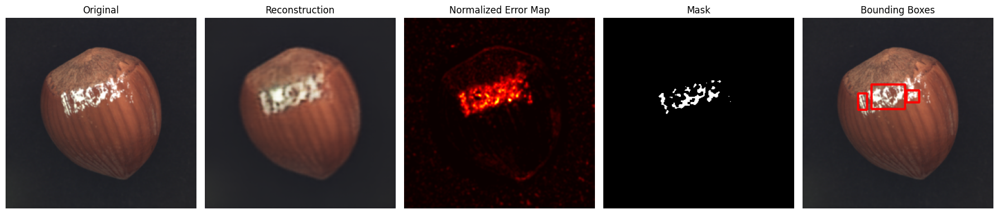

Category: pill
Defect type: contamination
Boxes: [{'x': 192, 'y': 185, 'w': 18, 'h': 9, 'area': 65.5}, {'x': 108, 'y': 126, 'w': 11, 'h': 16, 'area': 37.0}, {'x': 130, 'y': 114, 'w': 7, 'h': 11, 'area': 32.5}]


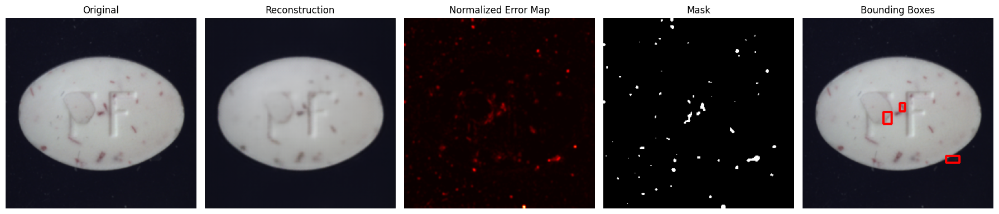

Category: capsule
Defect type: crack
Boxes: [{'x': 213, 'y': 124, 'w': 9, 'h': 12, 'area': 53.5}, {'x': 124, 'y': 151, 'w': 8, 'h': 11, 'area': 47.5}]


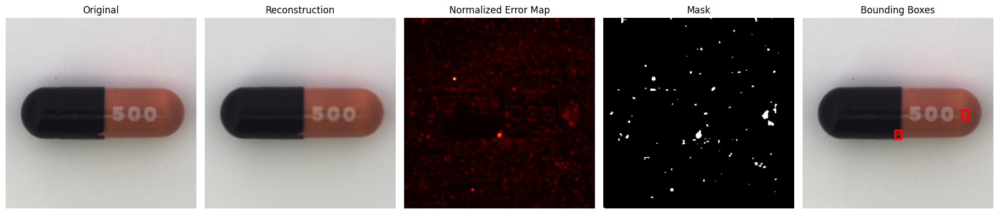

Category: pill
Defect type: contamination
Boxes: [{'x': 106, 'y': 143, 'w': 14, 'h': 12, 'area': 100.0}, {'x': 191, 'y': 139, 'w': 10, 'h': 15, 'area': 47.0}, {'x': 40, 'y': 133, 'w': 10, 'h': 9, 'area': 39.0}]


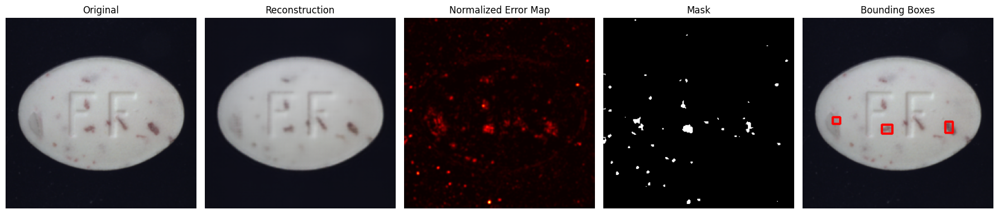

Category: hazelnut
Defect type: print
Boxes: [{'x': 72, 'y': 62, 'w': 26, 'h': 40, 'area': 255.0}, {'x': 84, 'y': 125, 'w': 26, 'h': 20, 'area': 170.0}, {'x': 90, 'y': 76, 'w': 10, 'h': 10, 'area': 35.0}, {'x': 86, 'y': 143, 'w': 9, 'h': 9, 'area': 30.5}]


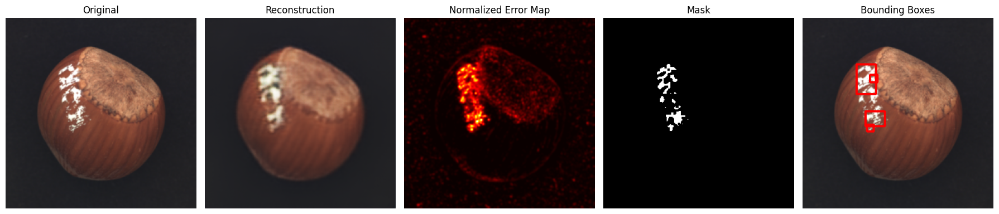

Category: bottle
Defect type: broken_small
Boxes: [{'x': 126, 'y': 178, 'w': 18, 'h': 11, 'area': 109.5}, {'x': 174, 'y': 163, 'w': 13, 'h': 11, 'area': 62.0}, {'x': 40, 'y': 107, 'w': 7, 'h': 11, 'area': 35.0}]


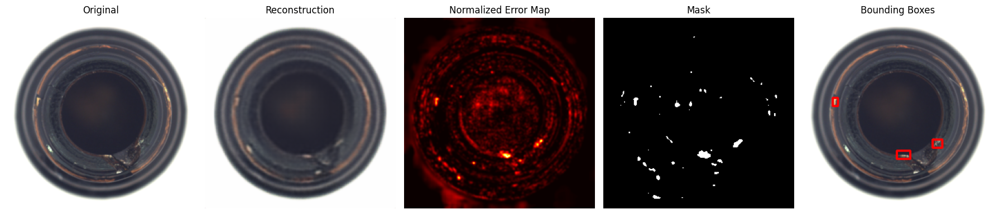

Category: metal_nut
Defect type: scratch
Boxes: []


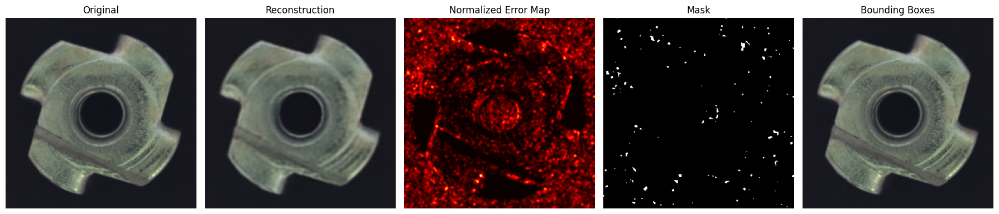

Category: capsule
Defect type: faulty_imprint
Boxes: [{'x': 62, 'y': 126, 'w': 66, 'h': 21, 'area': 319.5}, {'x': 150, 'y': 142, 'w': 8, 'h': 7, 'area': 34.0}]


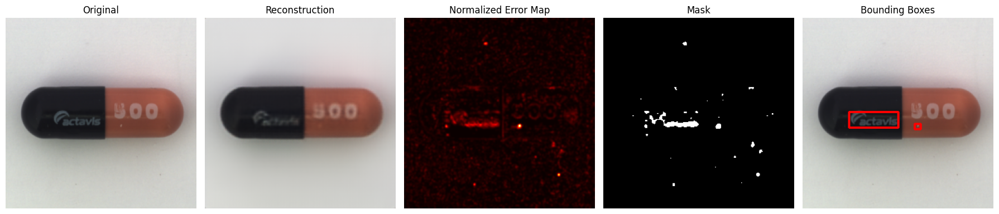

In [49]:
# =========================
# 44. Visualize Normalized Error Boxes
# =========================

anomaly_samples = [s for s in all_test_samples if s["label"] == 1]

selected_samples = random.sample(anomaly_samples, 8)

for sample in selected_samples:
    viz = generate_boxes_with_category_profile(
        model=best_model,
        sample=sample,
        transform=transform,
        device=DEVICE,
        category_error_profiles=category_error_profiles,
        z_percentile=99.0,
        min_area=30,
        kernel_size=3,
        max_boxes=5
    )

    print("=" * 80)
    print("Category:", viz["category"])
    print("Defect type:", viz["defect_type"])
    print("Boxes:", viz["boxes"])

    plt.figure(figsize=(18, 4))

    plt.subplot(1, 5, 1)
    plt.imshow(viz["original"])
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(viz["reconstructed"])
    plt.title("Reconstruction")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(viz["z_map"], cmap="hot")
    plt.title("Normalized Error Map")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(viz["mask"], cmap="gray")
    plt.title("Mask")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(viz["overlay"])
    plt.title("Bounding Boxes")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [50]:
# =========================
# 45. Category-Normalized Z-Map Scores
# =========================

def compute_category_normalized_scores(
    model,
    samples,
    transform,
    device,
    category_error_profiles,
    topk_percentages=(1, 5)
):
    model.eval()

    results = {
        "mean_z_score": [],
        "max_z_score": [],
        "labels": [],
        "categories": [],
        "defect_types": [],
        "paths": []
    }

    for topk in topk_percentages:
        results[f"top_{topk}_z_score"] = []

    with torch.no_grad():
        for sample in samples:
            image_pil = Image.open(sample["path"]).convert("RGB")
            image_tensor = transform(image_pil).unsqueeze(0).to(device)

            reconstruction = model(image_tensor)

            original = image_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
            reconstructed = reconstruction[0].detach().cpu().permute(1, 2, 0).numpy()

            error_map = np.mean(np.abs(original - reconstructed), axis=2)

            category = sample["category"]
            normal_mean = category_error_profiles[category]["mean"]
            normal_std = category_error_profiles[category]["std"]

            z_map = (error_map - normal_mean) / normal_std
            z_map = np.clip(z_map, 0, None)
            z_map = cv2.GaussianBlur(z_map.astype(np.float32), (5, 5), 0)

            flat_z = z_map.flatten()

            results["mean_z_score"].append(float(flat_z.mean()))
            results["max_z_score"].append(float(flat_z.max()))

            for topk in topk_percentages:
                k = max(1, int(len(flat_z) * (topk / 100)))
                top_values = np.partition(flat_z, -k)[-k:]
                results[f"top_{topk}_z_score"].append(float(top_values.mean()))

            results["labels"].append(sample["label"])
            results["categories"].append(sample["category"])
            results["defect_types"].append(sample["defect_type"])
            results["paths"].append(str(sample["path"]))

    for key in results:
        results[key] = np.array(results[key])

    results["labels"] = results["labels"].astype(np.int64)

    return results

In [51]:
# =========================
# 46. Compute Z-Map Scores
# =========================

val_z_results = compute_category_normalized_scores(
    model=best_model,
    samples=val_samples,
    transform=transform,
    device=DEVICE,
    category_error_profiles=category_error_profiles,
    topk_percentages=(1, 5)
)

test_z_results = compute_category_normalized_scores(
    model=best_model,
    samples=all_test_samples,
    transform=transform,
    device=DEVICE,
    category_error_profiles=category_error_profiles,
    topk_percentages=(1, 5)
)

z_score_names = [
    "mean_z_score",
    "top_1_z_score",
    "top_5_z_score",
    "max_z_score"
]

for score_name in z_score_names:
    y_true = test_z_results["labels"]
    y_score = test_z_results[score_name]

    print("=" * 70)
    print("Score:", score_name)
    print("ROC AUC:", roc_auc_score(y_true, y_score))
    print("Average Precision:", average_precision_score(y_true, y_score))
    print("Val P90:", np.percentile(val_z_results[score_name], 90))
    print("Val P95:", np.percentile(val_z_results[score_name], 95))
    print("Val P99:", np.percentile(val_z_results[score_name], 99))

Score: mean_z_score
ROC AUC: 0.6035590706870984
Average Precision: 0.8406836571930407
Val P90: 0.4688268661499024
Val P95: 0.5940053403377532
Val P99: 0.6501776063442228
Score: top_1_z_score
ROC AUC: 0.7161462624265391
Average Precision: 0.9020346128952894
Val P90: 3.9164544582366942
Val P95: 4.224493837356566
Val P99: 5.119608507156369
Score: top_5_z_score
ROC AUC: 0.6959823144944253
Average Precision: 0.8964288762293398
Val P90: 2.570042371749878
Val P95: 2.7450977563858014
Val P99: 3.0827233982086137
Score: max_z_score
ROC AUC: 0.6704701488438511
Average Precision: 0.8694897869298513
Val P90: 6.203851127624512
Val P95: 6.3042398452758786
Val P99: 6.608921527862548


In [52]:
# =========================
# 47. Hysteresis Mask for Better Defect Localization
# =========================

def hysteresis_mask_from_map(
    score_map,
    high_percentile=99.0,
    low_percentile=94.0,
    min_area=40,
    kernel_size=5,
    dilate_iterations=1
):
    """
    Creates a mask using two thresholds:
    - high threshold finds confident anomaly seeds
    - low threshold expands around connected suspicious regions
    """

    score_map = score_map.astype(np.float32)

    # Smooth to reduce tiny noisy peaks
    score_smooth = cv2.GaussianBlur(score_map, (5, 5), 0)

    high_thr = np.percentile(score_smooth, high_percentile)
    low_thr = np.percentile(score_smooth, low_percentile)

    high_mask = (score_smooth >= high_thr).astype(np.uint8)
    low_mask = (score_smooth >= low_thr).astype(np.uint8)

    # Connected components on low mask
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(low_mask, connectivity=8)

    final_mask = np.zeros_like(low_mask, dtype=np.uint8)

    for label_id in range(1, num_labels):
        component = (labels == label_id)

        # Keep only components that contain at least one high-confidence seed
        has_seed = np.any(high_mask[component] > 0)
        area = stats[label_id, cv2.CC_STAT_AREA]

        if has_seed and area >= min_area:
            final_mask[component] = 255

    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_CLOSE, kernel)

    if dilate_iterations > 0:
        final_mask = cv2.dilate(final_mask, kernel, iterations=dilate_iterations)

    return final_mask, score_smooth, {
        "high_threshold": float(high_thr),
        "low_threshold": float(low_thr)
    }

In [53]:
# =========================
# 48. Generate Boxes with Hysteresis
# =========================

def generate_boxes_with_hysteresis(
    model,
    sample,
    transform,
    device,
    category_error_profiles,
    high_percentile=99.0,
    low_percentile=94.0,
    min_area=40,
    kernel_size=5,
    dilate_iterations=1,
    max_boxes=5
):
    model.eval()

    image_pil = Image.open(sample["path"]).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        reconstruction = model(image_tensor)

    original = image_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
    reconstructed = reconstruction[0].detach().cpu().permute(1, 2, 0).numpy()

    error_map = np.mean(np.abs(original - reconstructed), axis=2)

    category = sample["category"]
    normal_mean = category_error_profiles[category]["mean"]
    normal_std = category_error_profiles[category]["std"]

    z_map = (error_map - normal_mean) / normal_std
    z_map = np.clip(z_map, 0, None)

    mask, z_map_smooth, thresholds = hysteresis_mask_from_map(
        score_map=z_map,
        high_percentile=high_percentile,
        low_percentile=low_percentile,
        min_area=min_area,
        kernel_size=kernel_size,
        dilate_iterations=dilate_iterations
    )

    contours, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []

    for contour in contours:
        area = cv2.contourArea(contour)

        if area < min_area:
            continue

        x, y, w, h = cv2.boundingRect(contour)

        boxes.append({
            "x": int(x),
            "y": int(y),
            "w": int(w),
            "h": int(h),
            "area": float(area)
        })

    boxes = sorted(boxes, key=lambda b: b["area"], reverse=True)[:max_boxes]

    overlay = (original * 255).astype(np.uint8).copy()

    for box in boxes:
        x, y, w, h = box["x"], box["y"], box["w"], box["h"]
        cv2.rectangle(overlay, (x, y), (x + w, y + h), (255, 0, 0), 2)

    return {
        "original": original,
        "reconstructed": reconstructed,
        "error_map": error_map,
        "z_map": z_map_smooth,
        "mask": mask,
        "overlay": overlay,
        "boxes": boxes,
        "thresholds": thresholds,
        "category": sample["category"],
        "label": sample["label"],
        "defect_type": sample["defect_type"],
        "path": str(sample["path"])
    }

Category: bottle
Defect type: contamination
Thresholds: {'high_threshold': 8.146029472351074, 'low_threshold': 3.156864643096924}
Boxes: [{'x': 74, 'y': 79, 'w': 111, 'h': 107, 'area': 6885.0}]


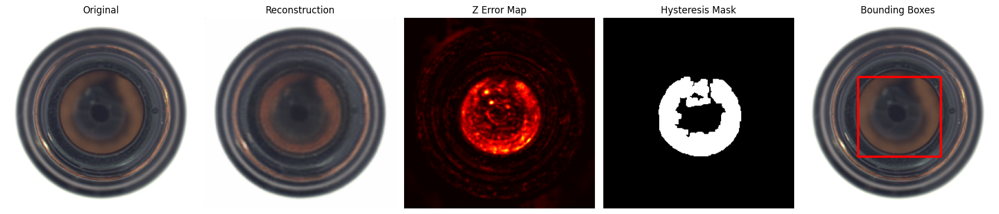

Category: bottle
Defect type: contamination
Thresholds: {'high_threshold': 7.30495023727417, 'low_threshold': 2.111326217651367}
Boxes: [{'x': 25, 'y': 188, 'w': 177, 'h': 68, 'area': 2853.5}, {'x': 19, 'y': 69, 'w': 111, 'h': 160, 'area': 2216.5}, {'x': 133, 'y': 75, 'w': 53, 'h': 94, 'area': 1144.5}]


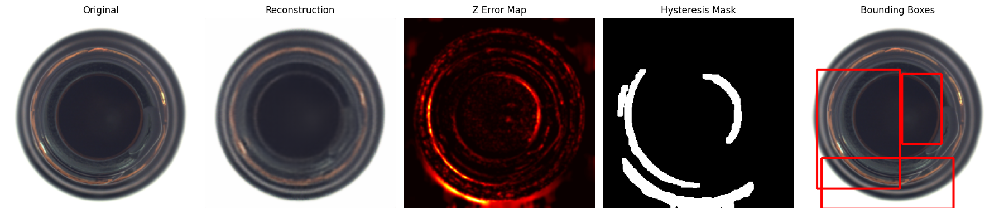

Category: bottle
Defect type: broken_small
Thresholds: {'high_threshold': 3.6518924236297607, 'low_threshold': 0.9770519733428955}
Boxes: [{'x': 156, 'y': 87, 'w': 55, 'h': 96, 'area': 2754.5}, {'x': 206, 'y': 131, 'w': 31, 'h': 66, 'area': 724.0}, {'x': 26, 'y': 114, 'w': 26, 'h': 42, 'area': 519.0}]


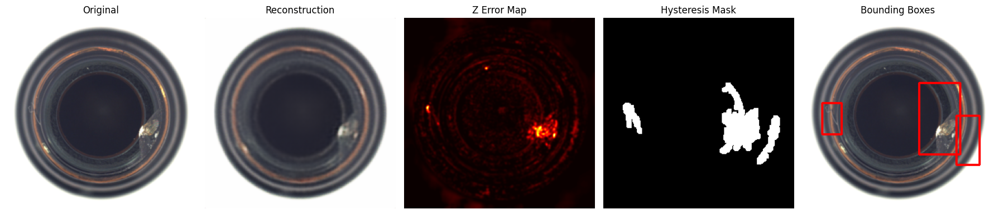

Category: bottle
Defect type: broken_small
Thresholds: {'high_threshold': 4.937218189239502, 'low_threshold': 1.4417630434036255}
Boxes: [{'x': 49, 'y': 70, 'w': 57, 'h': 123, 'area': 3576.5}, {'x': 156, 'y': 86, 'w': 100, 'h': 170, 'area': 3030.5}]


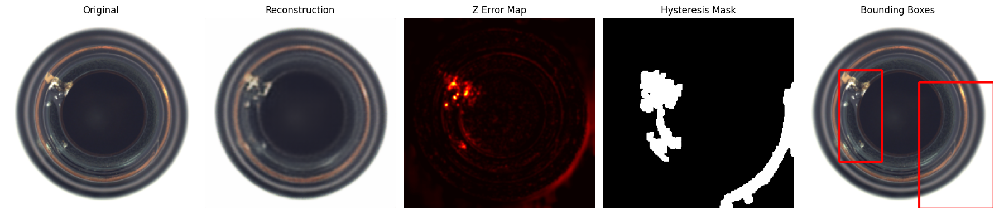

Category: bottle
Defect type: contamination
Thresholds: {'high_threshold': 7.689589977264404, 'low_threshold': 1.8885494470596313}
Boxes: [{'x': 73, 'y': 71, 'w': 111, 'h': 115, 'area': 7326.5}]


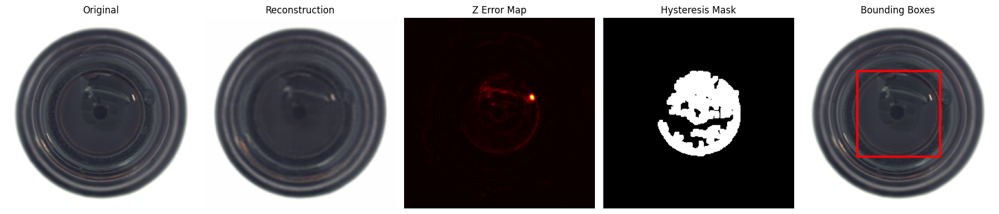

Category: bottle
Defect type: broken_large
Thresholds: {'high_threshold': 3.8826181888580322, 'low_threshold': 1.1620404720306396}
Boxes: [{'x': 11, 'y': 0, 'w': 98, 'h': 83, 'area': 2456.0}, {'x': 104, 'y': 42, 'w': 40, 'h': 49, 'area': 1237.5}, {'x': 215, 'y': 70, 'w': 23, 'h': 85, 'area': 783.5}]


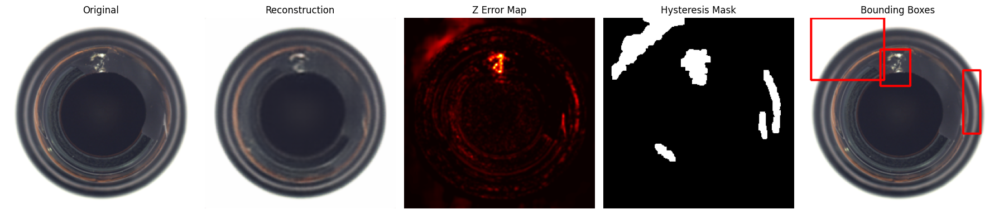

In [54]:
# =========================
# 49. Test Hysteresis Boxes on Bottle Defects
# =========================

bottle_anomaly_samples = [
    s for s in all_test_samples
    if s["category"] == "bottle" and s["label"] == 1
]

selected_samples = random.sample(bottle_anomaly_samples, min(6, len(bottle_anomaly_samples)))

for sample in selected_samples:
    viz = generate_boxes_with_hysteresis(
        model=best_model,
        sample=sample,
        transform=transform,
        device=DEVICE,
        category_error_profiles=category_error_profiles,
        high_percentile=99.0,
        low_percentile=92.0,
        min_area=80,
        kernel_size=5,
        dilate_iterations=1,
        max_boxes=3
    )

    print("=" * 80)
    print("Category:", viz["category"])
    print("Defect type:", viz["defect_type"])
    print("Thresholds:", viz["thresholds"])
    print("Boxes:", viz["boxes"])

    plt.figure(figsize=(18, 4))

    plt.subplot(1, 5, 1)
    plt.imshow(viz["original"])
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(viz["reconstructed"])
    plt.title("Reconstruction")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(viz["z_map"], cmap="hot")
    plt.title("Z Error Map")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(viz["mask"], cmap="gray")
    plt.title("Hysteresis Mask")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(viz["overlay"])
    plt.title("Bounding Boxes")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [55]:
# =========================
# 50. Conservative Bounding Boxes
# =========================

def generate_conservative_boxes(
    model,
    sample,
    transform,
    device,
    category_error_profiles,
    high_percentile=99.5,
    low_percentile=96.0,
    min_area=40,
    max_area_ratio=0.12,
    kernel_size=3,
    dilate_iterations=0,
    max_boxes=3,
    min_mean_z=1.0
):
    model.eval()

    image_pil = Image.open(sample["path"]).convert("RGB")
    image_tensor = transform(image_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        reconstruction = model(image_tensor)

    original = image_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
    reconstructed = reconstruction[0].detach().cpu().permute(1, 2, 0).numpy()

    error_map = np.mean(np.abs(original - reconstructed), axis=2)

    category = sample["category"]
    normal_mean = category_error_profiles[category]["mean"]
    normal_std = category_error_profiles[category]["std"]

    z_map = (error_map - normal_mean) / normal_std
    z_map = np.clip(z_map, 0, None)
    z_map = cv2.GaussianBlur(z_map.astype(np.float32), (5, 5), 0)

    high_thr = np.percentile(z_map, high_percentile)
    low_thr = np.percentile(z_map, low_percentile)

    high_mask = (z_map >= high_thr).astype(np.uint8)
    low_mask = (z_map >= low_thr).astype(np.uint8)

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(low_mask, connectivity=8)

    final_mask = np.zeros_like(low_mask, dtype=np.uint8)

    H, W = z_map.shape
    image_area = H * W

    components = []

    for label_id in range(1, num_labels):
        component = (labels == label_id)

        has_seed = np.any(high_mask[component] > 0)
        area = int(stats[label_id, cv2.CC_STAT_AREA])

        if not has_seed:
            continue

        if area < min_area:
            continue

        if area > image_area * max_area_ratio:
            continue

        component_values = z_map[component]
        mean_z = float(component_values.mean())
        max_z = float(component_values.max())

        if mean_z < min_mean_z:
            continue

        x = int(stats[label_id, cv2.CC_STAT_LEFT])
        y = int(stats[label_id, cv2.CC_STAT_TOP])
        w = int(stats[label_id, cv2.CC_STAT_WIDTH])
        h = int(stats[label_id, cv2.CC_STAT_HEIGHT])

        score = mean_z * np.log1p(area) + 0.3 * max_z

        components.append({
            "label_id": label_id,
            "x": x,
            "y": y,
            "w": w,
            "h": h,
            "area": area,
            "mean_z": mean_z,
            "max_z": max_z,
            "score": score
        })

    components = sorted(components, key=lambda c: c["score"], reverse=True)[:max_boxes]

    for comp in components:
        final_mask[labels == comp["label_id"]] = 255

    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_OPEN, kernel)
    final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_CLOSE, kernel)

    if dilate_iterations > 0:
        final_mask = cv2.dilate(final_mask, kernel, iterations=dilate_iterations)

    overlay = (original * 255).astype(np.uint8).copy()

    boxes = []
    for comp in components:
        box = {
            "x": comp["x"],
            "y": comp["y"],
            "w": comp["w"],
            "h": comp["h"],
            "area": comp["area"],
            "mean_z": comp["mean_z"],
            "max_z": comp["max_z"],
            "score": comp["score"]
        }
        boxes.append(box)

        cv2.rectangle(
            overlay,
            (box["x"], box["y"]),
            (box["x"] + box["w"], box["y"] + box["h"]),
            (255, 0, 0),
            2
        )

    return {
        "original": original,
        "reconstructed": reconstructed,
        "z_map": z_map,
        "mask": final_mask,
        "overlay": overlay,
        "boxes": boxes,
        "category": sample["category"],
        "label": sample["label"],
        "defect_type": sample["defect_type"],
        "path": str(sample["path"]),
        "thresholds": {
            "high_threshold": float(high_thr),
            "low_threshold": float(low_thr)
        }
    }

Defect type: broken_large
Thresholds: {'high_threshold': 6.064964771270752, 'low_threshold': 1.9922581911087036}
Boxes: [{'x': 61, 'y': 122, 'w': 31, 'h': 64, 'area': 892, 'mean_z': 5.519354820251465, 'max_z': 23.089111328125, 'score': np.float64(44.42846759521412)}, {'x': 183, 'y': 174, 'w': 8, 'h': 12, 'area': 69, 'mean_z': 5.784555435180664, 'max_z': 14.132233619689941, 'score': np.float64(28.815326329642797)}]


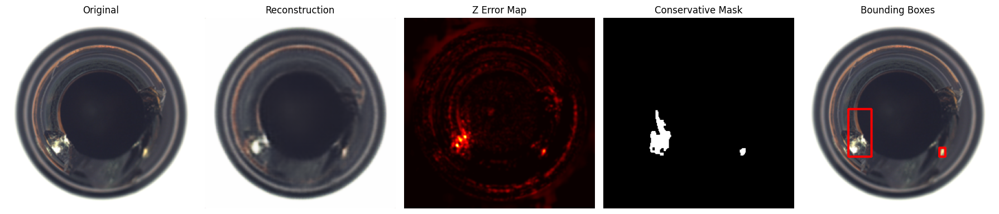

Defect type: broken_large
Thresholds: {'high_threshold': 4.137197017669678, 'low_threshold': 1.8146719932556152}
Boxes: [{'x': 224, 'y': 125, 'w': 11, 'h': 42, 'area': 240, 'mean_z': 3.6550724506378174, 'max_z': 6.923654556274414, 'score': np.float64(22.124426535826796)}, {'x': 140, 'y': 114, 'w': 16, 'h': 24, 'area': 192, 'mean_z': 3.418508768081665, 'max_z': 7.0482988357543945, 'score': np.float64(20.105042205195026)}]


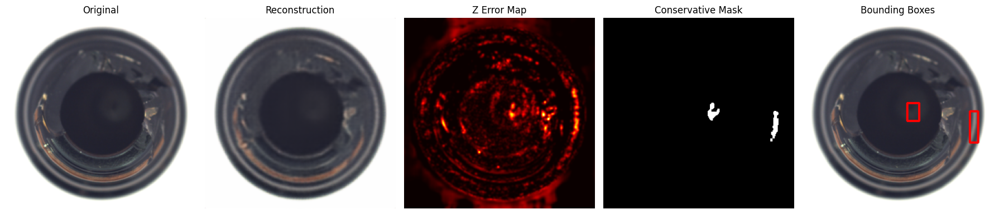

Defect type: broken_large
Thresholds: {'high_threshold': 10.427983283996582, 'low_threshold': 1.8937324285507202}
Boxes: [{'x': 74, 'y': 45, 'w': 89, 'h': 35, 'area': 1358, 'mean_z': 7.484408855438232, 'max_z': 27.599010467529297, 'score': np.float64(62.27600386512982)}]


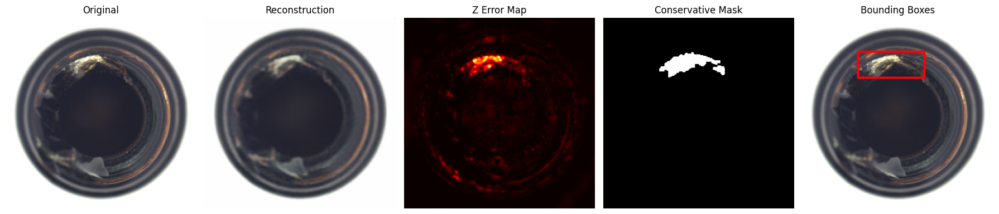

Defect type: contamination
Thresholds: {'high_threshold': 13.402508735656738, 'low_threshold': 4.462844371795654}
Boxes: [{'x': 205, 'y': 71, 'w': 51, 'h': 151, 'area': 1581, 'mean_z': 10.374173164367676, 'max_z': 24.989093780517578, 'score': np.float64(83.91750570872192)}]


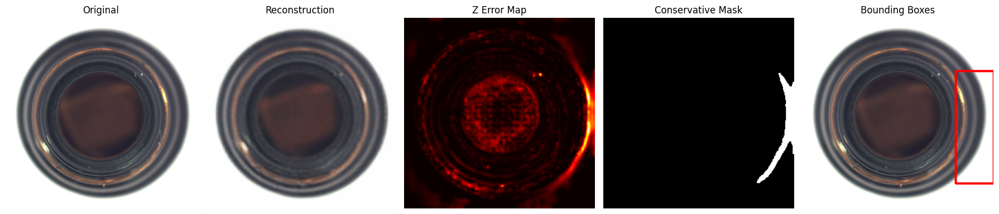

Defect type: contamination
Thresholds: {'high_threshold': 9.255359649658203, 'low_threshold': 5.319945812225342}
Boxes: [{'x': 96, 'y': 136, 'w': 84, 'h': 47, 'area': 1294, 'mean_z': 7.540464878082275, 'max_z': 16.707447052001953, 'score': np.float64(59.049211000551345)}, {'x': 149, 'y': 86, 'w': 28, 'h': 35, 'area': 398, 'mean_z': 7.158211708068848, 'max_z': 10.895606994628906, 'score': np.float64(46.13893583194229)}]


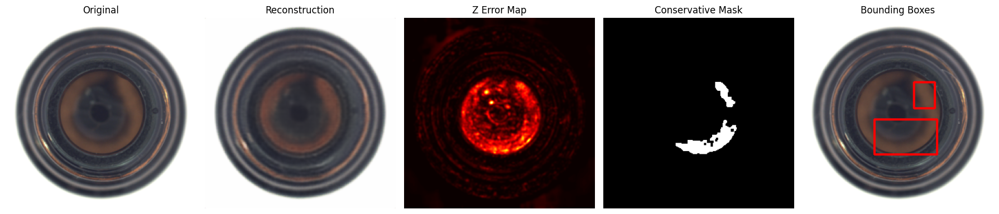

Defect type: broken_small
Thresholds: {'high_threshold': 7.503444194793701, 'low_threshold': 1.8626257181167603}
Boxes: [{'x': 142, 'y': 55, 'w': 46, 'h': 49, 'area': 1166, 'mean_z': 5.725302219390869, 'max_z': 24.092866897583008, 'score': np.float64(47.66104149536875)}, {'x': 187, 'y': 115, 'w': 22, 'h': 37, 'area': 292, 'mean_z': 5.138947010040283, 'max_z': 18.61789894104004, 'score': np.float64(34.775475727932985)}]


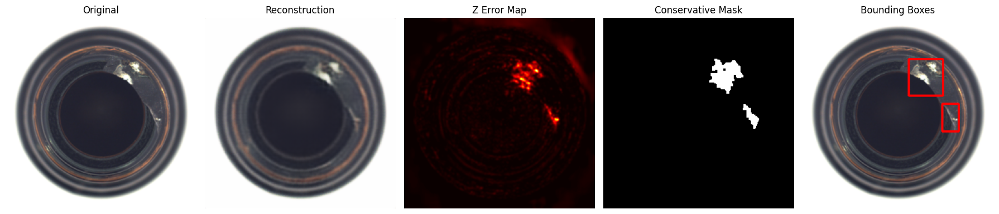

In [56]:
# =========================
# 51. Test Conservative Boxes on Bottle
# =========================

bottle_anomaly_samples = [
    s for s in all_test_samples
    if s["category"] == "bottle" and s["label"] == 1
]

selected_samples = random.sample(bottle_anomaly_samples, min(6, len(bottle_anomaly_samples)))

for sample in selected_samples:
    viz = generate_conservative_boxes(
        model=best_model,
        sample=sample,
        transform=transform,
        device=DEVICE,
        category_error_profiles=category_error_profiles,
        high_percentile=99.5,
        low_percentile=96.0,
        min_area=40,
        max_area_ratio=0.12,
        kernel_size=3,
        dilate_iterations=0,
        max_boxes=2,
        min_mean_z=1.0
    )

    print("=" * 80)
    print("Defect type:", viz["defect_type"])
    print("Thresholds:", viz["thresholds"])
    print("Boxes:", viz["boxes"])

    plt.figure(figsize=(18, 4))

    plt.subplot(1, 5, 1)
    plt.imshow(viz["original"])
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 5, 2)
    plt.imshow(viz["reconstructed"])
    plt.title("Reconstruction")
    plt.axis("off")

    plt.subplot(1, 5, 3)
    plt.imshow(viz["z_map"], cmap="hot")
    plt.title("Z Error Map")
    plt.axis("off")

    plt.subplot(1, 5, 4)
    plt.imshow(viz["mask"], cmap="gray")
    plt.title("Conservative Mask")
    plt.axis("off")

    plt.subplot(1, 5, 5)
    plt.imshow(viz["overlay"])
    plt.title("Bounding Boxes")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [57]:
# =========================
# 52. Final Experiment Naming
# =========================

from datetime import datetime
import json
import shutil

MODEL_NAME = "multi_product_denoising_conv_autoencoder"
EXPERIMENT_NAME = "mvtec_structured_objects_dae_v1"

OUTPUT_DIR = Path("/content/model_artifacts")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

print("Model name:", MODEL_NAME)
print("Experiment:", EXPERIMENT_NAME)
print("Output dir:", OUTPUT_DIR)
print("Timestamp:", timestamp)

Model name: multi_product_denoising_conv_autoencoder
Experiment: mvtec_structured_objects_dae_v1
Output dir: /content/model_artifacts
Timestamp: 20260529_024233


In [58]:
# =========================
# 53. Save Final Model File
# =========================

final_model_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_best_model.pt"

shutil.copy(best_model_path, final_model_path)

print("Best model copied to:")
print(final_model_path)

Best model copied to:
/content/model_artifacts/mvtec_structured_objects_dae_v1_best_model.pt


In [59]:
# =========================
# 54. Save Training History JSON
# =========================

best_epoch_idx = int(np.argmin(history["val_loss"]))

history_records = []

for i in range(len(history["epoch"])):
    history_records.append({
        "epoch": int(history["epoch"][i]),
        "train_loss": float(history["train_loss"][i]),
        "val_loss": float(history["val_loss"][i]),
        "learning_rate": float(history["lr"][i])
    })

training_history = {
    "experiment_name": EXPERIMENT_NAME,
    "model_name": MODEL_NAME,
    "model_class": "DenoisingConvAutoencoder",
    "created_at": datetime.now().isoformat(),
    "dataset": "MVTec AD",
    "selected_categories": SELECTED_CATEGORIES,
    "epochs_trained": len(history["epoch"]),
    "best_epoch": int(history["epoch"][best_epoch_idx]),
    "best_train_loss": float(history["train_loss"][best_epoch_idx]),
    "best_val_loss": float(history["val_loss"][best_epoch_idx]),
    "history": history_records
}

training_history_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_training_history.json"

with open(training_history_path, "w") as f:
    json.dump(training_history, f, indent=4)

print("Training history saved at:")
print(training_history_path)
print("Best epoch:", training_history["best_epoch"])
print("Best val loss:", training_history["best_val_loss"])

Training history saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_training_history.json
Best epoch: 96
Best val loss: 0.009265279242148003


In [60]:
# =========================
# 55. Save Experiment Config JSON
# =========================

experiment_config = {
    "experiment_name": EXPERIMENT_NAME,
    "model_name": MODEL_NAME,
    "model_class": "DenoisingConvAutoencoder",
    "model_file": str(final_model_path.name),
    "created_at": datetime.now().isoformat(),

    "dataset": {
        "name": "MVTec AD",
        "source": "Kaggle mirror: ipythonx/mvtec-ad",
        "selected_categories": SELECTED_CATEGORIES,
        "train_samples": len(train_samples),
        "validation_samples": len(val_samples),
        "test_samples": len(all_test_samples),
        "test_normal_samples": int(sum(1 for s in all_test_samples if s["label"] == 0)),
        "test_anomaly_samples": int(sum(1 for s in all_test_samples if s["label"] == 1))
    },

    "preprocessing": {
        "image_size": IMG_SIZE,
        "channels": 3,
        "normalization": "ToTensor only; pixel range [0, 1]",
        "resize": [IMG_SIZE, IMG_SIZE]
    },

    "training": {
        "batch_size": BATCH_SIZE,
        "epochs": EPOCHS,
        "initial_learning_rate": LEARNING_RATE,
        "noise_factor": NOISE_FACTOR,
        "loss_function": "L1Loss",
        "optimizer": "Adam",
        "weight_decay": 1e-5,
        "scheduler": "ReduceLROnPlateau",
        "scheduler_factor": 0.5,
        "scheduler_patience": 8
    },

    "architecture": {
        "type": "Denoising convolutional autoencoder",
        "latent_channels": 256,
        "encoder_downsampling": "256x256 -> 16x16",
        "output_activation": "Sigmoid",
        "total_parameters": int(total_params),
        "trainable_parameters": int(trainable_params)
    }
}

experiment_config_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_config.json"

with open(experiment_config_path, "w") as f:
    json.dump(experiment_config, f, indent=4)

print("Experiment config saved at:")
print(experiment_config_path)

Experiment config saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_config.json


In [61]:
# =========================
# 56. Save Thresholds JSON
# =========================

# Thresholds antigos/brutos por categoria, se já existirem
raw_category_thresholds = {}

if "category_thresholds" in globals():
    raw_category_thresholds = {
        category: float(value)
        for category, value in category_thresholds.items()
    }

# Thresholds novos usando z-score por categoria
SELECTED_FINAL_SCORE = "top_1_z_score"
FINAL_THRESHOLD_PERCENTILE = 95

z_category_thresholds = {}

for category in SELECTED_CATEGORIES:
    category_mask = val_z_results["categories"] == category
    category_scores = val_z_results[SELECTED_FINAL_SCORE][category_mask]

    threshold = np.percentile(category_scores, FINAL_THRESHOLD_PERCENTILE)

    z_category_thresholds[category] = {
        "threshold": float(threshold),
        "percentile": FINAL_THRESHOLD_PERCENTILE,
        "score_name": SELECTED_FINAL_SCORE,
        "validation_samples": int(len(category_scores)),
        "validation_mean": float(category_scores.mean()),
        "validation_std": float(category_scores.std()),
        "validation_min": float(category_scores.min()),
        "validation_max": float(category_scores.max())
    }

thresholds_config = {
    "experiment_name": EXPERIMENT_NAME,
    "created_at": datetime.now().isoformat(),

    "recommended_score": SELECTED_FINAL_SCORE,
    "recommended_threshold_type": "category_specific",
    "recommended_threshold_percentile": FINAL_THRESHOLD_PERCENTILE,

    "notes": {
        "mean_score": "Global mean reconstruction error performed poorly because small defects were diluted.",
        "top_1_z_score": "Recommended score. Computed from the top 1 percent of category-normalized reconstruction error map.",
        "category_specific_thresholds": "Recommended because each product category has different reconstruction error distribution."
    },

    "raw_top_1_thresholds": raw_category_thresholds,
    "z_score_thresholds": z_category_thresholds
}

thresholds_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_thresholds.json"

with open(thresholds_path, "w") as f:
    json.dump(thresholds_config, f, indent=4)

print("Thresholds saved at:")
print(thresholds_path)

print("\nRecommended thresholds:")
for category, data in z_category_thresholds.items():
    print(f"{category:10s}: {data['threshold']:.6f}")

Thresholds saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_thresholds.json

Recommended thresholds:
bottle    : 3.911203
capsule   : 2.977278
hazelnut  : 3.581425
metal_nut : 2.291914
pill      : 3.853938
screw     : 4.364778
zipper    : 5.174765


In [62]:
# =========================
# 57. Save Bounding Box / Visualization Config JSON
# =========================

bbox_config = {
    "experiment_name": EXPERIMENT_NAME,
    "created_at": datetime.now().isoformat(),

    "localization_method": "category_normalized_reconstruction_error",
    "description": (
        "Bounding boxes are derived from post-processed reconstruction error maps. "
        "They represent approximate suspicious regions, not supervised ground-truth object detection boxes."
    ),

    "recommended_visual_outputs": [
        "original_image",
        "reconstruction",
        "normalized_error_heatmap",
        "binary_mask",
        "approximate_bounding_boxes",
        "anomaly_score",
        "status"
    ],

    "score_map": {
        "base_error": "mean_absolute_error_per_pixel_across_rgb_channels",
        "normalization": "category z-score normalization",
        "formula": "z_map = max((error_map - category_mean_error_map) / category_std_error_map, 0)",
        "smoothing": {
            "method": "GaussianBlur",
            "kernel_size": [5, 5]
        }
    },

    "classification": {
        "recommended_score": "top_1_z_score",
        "threshold_source": "category_specific_thresholds",
        "threshold_file": str(thresholds_path.name)
    },

    "bounding_boxes": {
        "method": "conservative_connected_components_on_z_map",
        "high_percentile": 99.5,
        "low_percentile": 96.0,
        "min_area": 40,
        "max_area_ratio": 0.12,
        "kernel_size": 3,
        "dilate_iterations": 0,
        "max_boxes": 2,
        "min_mean_z": 1.0,
        "box_color_rgb": [255, 0, 0],
        "box_thickness": 2
    },

    "frontend_guidance": {
        "primary_visual": "heatmap",
        "secondary_visual": "approximate_bounding_boxes",
        "warning": (
            "Do not interpret bounding boxes as exact defect segmentation. "
            "Use them as visual hints for suspicious regions."
        ),
        "recommended_label": "Approximate suspicious region"
    }
}

bbox_config_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_bbox_visualization_config.json"

with open(bbox_config_path, "w") as f:
    json.dump(bbox_config, f, indent=4)

print("Bounding box config saved at:")
print(bbox_config_path)

Bounding box config saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_bbox_visualization_config.json


In [63]:
# =========================
# 58. Save Final Metrics JSON
# =========================

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Final predictions usando top_1_z_score + thresholds por categoria
final_scores = test_z_results[SELECTED_FINAL_SCORE]
final_labels = test_z_results["labels"]
final_categories = test_z_results["categories"]

final_predictions = []

for score, category in zip(final_scores, final_categories):
    threshold = z_category_thresholds[category]["threshold"]
    final_predictions.append(int(score > threshold))

final_predictions = np.array(final_predictions)

final_confusion_matrix = confusion_matrix(final_labels, final_predictions).tolist()

final_metrics = {
    "experiment_name": EXPERIMENT_NAME,
    "created_at": datetime.now().isoformat(),

    "recommended_score": SELECTED_FINAL_SCORE,
    "threshold_type": "category_specific",
    "threshold_percentile": FINAL_THRESHOLD_PERCENTILE,

    "global_metrics": {
        "roc_auc": float(roc_auc_score(final_labels, final_scores)),
        "average_precision": float(average_precision_score(final_labels, final_scores)),
        "accuracy": float(accuracy_score(final_labels, final_predictions)),
        "precision_anomaly": float(precision_score(final_labels, final_predictions, pos_label=1, zero_division=0)),
        "recall_anomaly": float(recall_score(final_labels, final_predictions, pos_label=1, zero_division=0)),
        "f1_anomaly": float(f1_score(final_labels, final_predictions, pos_label=1, zero_division=0)),
        "confusion_matrix": final_confusion_matrix
    },

    "score_comparison": {},

    "category_metrics": {}
}

# Score comparison
for score_name in z_score_names:
    y_score = test_z_results[score_name]

    final_metrics["score_comparison"][score_name] = {
        "roc_auc": float(roc_auc_score(final_labels, y_score)),
        "average_precision": float(average_precision_score(final_labels, y_score))
    }

# Category metrics
for category in SELECTED_CATEGORIES:
    mask = final_categories == category

    y_true_cat = final_labels[mask]
    y_score_cat = final_scores[mask]
    y_pred_cat = final_predictions[mask]

    category_data = {
        "samples": int(len(y_true_cat)),
        "normal_samples": int(np.sum(y_true_cat == 0)),
        "anomaly_samples": int(np.sum(y_true_cat == 1)),
        "confusion_matrix": confusion_matrix(y_true_cat, y_pred_cat).tolist(),
        "accuracy": float(accuracy_score(y_true_cat, y_pred_cat)),
        "precision_anomaly": float(precision_score(y_true_cat, y_pred_cat, pos_label=1, zero_division=0)),
        "recall_anomaly": float(recall_score(y_true_cat, y_pred_cat, pos_label=1, zero_division=0)),
        "f1_anomaly": float(f1_score(y_true_cat, y_pred_cat, pos_label=1, zero_division=0))
    }

    if len(np.unique(y_true_cat)) > 1:
        category_data["roc_auc"] = float(roc_auc_score(y_true_cat, y_score_cat))
        category_data["average_precision"] = float(average_precision_score(y_true_cat, y_score_cat))

    final_metrics["category_metrics"][category] = category_data

metrics_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_final_metrics.json"

with open(metrics_path, "w") as f:
    json.dump(final_metrics, f, indent=4)

print("Final metrics saved at:")
print(metrics_path)

print("\nGlobal metrics:")
for k, v in final_metrics["global_metrics"].items():
    print(k, ":", v)

Final metrics saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_final_metrics.json

Global metrics:
roc_auc : 0.7161462624265391
average_precision : 0.9020346128952894
accuracy : 0.7559912854030502
precision_anomaly : 0.8421787709497207
recall_anomaly : 0.8445378151260504
f1_anomaly : 0.8433566433566434
confusion_matrix : [[91, 113], [111, 603]]


In [64]:
# =========================
# 59. Save Category Error Profiles
# =========================

profiles_npz_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_category_error_profiles.npz"

profile_arrays = {}

for category in SELECTED_CATEGORIES:
    profile_arrays[f"{category}_mean"] = category_error_profiles[category]["mean"]
    profile_arrays[f"{category}_std"] = category_error_profiles[category]["std"]

np.savez_compressed(profiles_npz_path, **profile_arrays)

print("Category error profiles saved at:")
print(profiles_npz_path)

Category error profiles saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_category_error_profiles.npz


In [65]:
# =========================
# 60. Save Error Profile Metadata
# =========================

profile_metadata = {
    "experiment_name": EXPERIMENT_NAME,
    "created_at": datetime.now().isoformat(),
    "profile_file": str(profiles_npz_path.name),
    "description": (
        "Category-specific normal reconstruction error profiles used to compute normalized z-error maps."
    ),
    "categories": {}
}

for category in SELECTED_CATEGORIES:
    profile_metadata["categories"][category] = {
        "mean_key": f"{category}_mean",
        "std_key": f"{category}_std",
        "shape": list(category_error_profiles[category]["mean"].shape)
    }

profile_metadata_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_error_profile_metadata.json"

with open(profile_metadata_path, "w") as f:
    json.dump(profile_metadata, f, indent=4)

print("Error profile metadata saved at:")
print(profile_metadata_path)

Error profile metadata saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_error_profile_metadata.json


In [66]:
# =========================
# 61. Save Artifact Manifest
# =========================

manifest = {
    "experiment_name": EXPERIMENT_NAME,
    "model_name": MODEL_NAME,
    "created_at": datetime.now().isoformat(),

    "artifacts": {
        "model": str(final_model_path.name),
        "training_history": str(training_history_path.name),
        "experiment_config": str(experiment_config_path.name),
        "thresholds": str(thresholds_path.name),
        "bbox_visualization_config": str(bbox_config_path.name),
        "final_metrics": str(metrics_path.name),
        "category_error_profiles": str(profiles_npz_path.name),
        "error_profile_metadata": str(profile_metadata_path.name)
    },

    "recommended_inference_pipeline": [
        "load model",
        "load category error profiles",
        "preprocess image to 256x256 RGB tensor in [0, 1]",
        "reconstruct image with autoencoder",
        "compute absolute reconstruction error map",
        "normalize error map using category mean/std profile",
        "compute top_1_z_score",
        "compare score against category-specific threshold",
        "generate heatmap and approximate bounding boxes from z-map",
        "return status, score, threshold, heatmap, boxes and reconstruction"
    ]
}

manifest_path = OUTPUT_DIR / f"{EXPERIMENT_NAME}_manifest.json"

with open(manifest_path, "w") as f:
    json.dump(manifest, f, indent=4)

print("Manifest saved at:")
print(manifest_path)

Manifest saved at:
/content/model_artifacts/mvtec_structured_objects_dae_v1_manifest.json


In [67]:
# =========================
# 62. Zip All Artifacts
# =========================

zip_path = Path("/content") / f"{EXPERIMENT_NAME}_artifacts.zip"

shutil.make_archive(
    base_name=str(zip_path).replace(".zip", ""),
    format="zip",
    root_dir=OUTPUT_DIR
)

print("Artifacts ZIP created at:")
print(zip_path)

print("\nFiles inside output dir:")
for p in sorted(OUTPUT_DIR.iterdir()):
    print("-", p.name)

Artifacts ZIP created at:
/content/mvtec_structured_objects_dae_v1_artifacts.zip

Files inside output dir:
- mvtec_structured_objects_dae_v1_bbox_visualization_config.json
- mvtec_structured_objects_dae_v1_best_model.pt
- mvtec_structured_objects_dae_v1_category_error_profiles.npz
- mvtec_structured_objects_dae_v1_config.json
- mvtec_structured_objects_dae_v1_error_profile_metadata.json
- mvtec_structured_objects_dae_v1_final_metrics.json
- mvtec_structured_objects_dae_v1_manifest.json
- mvtec_structured_objects_dae_v1_thresholds.json
- mvtec_structured_objects_dae_v1_training_history.json


In [68]:
# =========================
# 63. Download Artifacts
# =========================

from google.colab import files

files.download(str(zip_path))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>